Surgery Risk Analysis


> María Alejandra Aponte Lerín

## INTRODUCTION
This project focuses on analyzing surgical risk from a statistical and machine learning perspective.
The dataset used contains information on neurological complications following cardiovascular surgeries. The target variable is neuro, which indicates whether or not a patient experienced a neurological condition after surgery.

The analysis begins with exploratory data analysis (EDA), followed by data preprocessing and the implementation of various predictive models to assess risk factors and outcomes.


# EDA



In this section, we will gain a general understanding of the dataset, which will allow us to assess potential preprocessing steps and guide the subsequent modeling process.


## IMPORTING LIBRARIES




In [ ]:
%pip install keras-tuner
!pip install lime
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=4bacdb63b4d9262e08e2a983ad9e0e4d2910b1606dcfa0d894bdadc251692ac8
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 6.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score
import itertools # Importante
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestClassifier
from shap import Explainer, Explanation
from shap import waterfall_plot
import shap
import lime
import lime.lime_tabular
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from google.colab import drive
#drive.mount('/content/drive')
import os
#os.chdir("/content/drive/MyDrive/TFG/cod TSVM/Twin-SVM-master")
from TVSVM import TwinSVMClassifier
from sklearn import preprocessing
from sklearn.base import BaseEstimator, ClassifierMixin
import KernelFunction as kf
import TwinPlane1
import TwinPlane2
#from sklearn.datasets import load_boston
from sklearn.datasets import fetch_california_housing
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import random as python_random
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from keras.callbacks import EarlyStopping
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score
from sklearn.impute import KNNImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, RobustScaler, MaxAbsScaler
from sklearn.svm import SVR
from sklearn.model_selection import TimeSeriesSplit
import seaborn as sns
from sklearn.svm import SVC
from sklearn.svm import NuSVC
from sklearn.tree import DecisionTreeRegressor

## IMPORTING DATASET

In [ ]:
#datosneu = '/content/drive/MyDrive/TFG/TFG Alejandra/datos/Neurological-complications-after-cardiac-surgery/Database.xlsx'#
datosneu = 'Database.xlsx'
dfneu= pd.read_excel(datosneu)

In [ ]:
# Exploring dataframe
print(dfneu.shape)
print(dfneu.columns)
print(dfneu.dtypes)
print(dfneu.describe())

(206, 74)
Index(['idstata', 'sex', 'bmi', 'bsa', 'death', 'neuro', 'icaus', 'bilat',
       'bil2', 'rstenosis', 'lstenosis', 'occlus', 'bilatG', 'diabete',
       'ipertens', 'smoke', 'dislipidem', 'familiar', 'crf', 'surgtyp',
       'timecpb', 'timeac', 'onpube', 'onpuar', 'offpum', 'intrah', 'nanast',
       'croute', 'ctype', 'rhtm', 'timecpbs', 'ballpump', 'defrib', 'tvb',
       'cpbcompl', 'severhyp', 'erythr', 'plasma', 'plt', 'vasoac', 'tipo',
       'dd15', 'brainAtr', 'cli', 'ci', 'stroke', 'nlesions', 'llocation',
       'lnumber', 'lside', 'lsize', 'intrach', 'hloc', 'hside', 'hext', 'icut',
       'offpn2', 'anastcor', 'surgtype', 'surgType', 'rplacca', 'rica',
       'lplacca', 'lica', 'anastcorg', 'rsten2', 'lsten2', 'rhtm2', 'nuerStk',
       'nuerStk2', 'nuerStk3', 'neuro3', 'group', 'neuro2'],
      dtype='object')
idstata       int64
sex           int64
bmi         float64
bsa         float64
death         int64
             ...   
nuerStk2    float64
nuerStk3    f

The dataset contains 206 observations and 74 features.
Descriptive statistics such as the mean, variance, minimum, maximum, and quartiles have been calculated for all variables.

To ensure proper analysis, the relevant variables are converted to the correct data types.

In [ ]:
dfneu['idstata'] = dfneu['idstata'].astype('object')
print(dfneu.dtypes)


idstata      object
sex           int64
bmi         float64
bsa         float64
death         int64
             ...   
nuerStk2    float64
nuerStk3    float64
neuro3      float64
group         int64
neuro2      float64
Length: 74, dtype: object


In [ ]:
# Searching features with character 'D'
columns_with_d = [col for col in dfneu.columns if 'D' in dfneu[col].astype(str).values]
print(f"Columnas que contienen 'D': {columns_with_d}")


Columnas que contienen 'D': ['surgtype']


In [ ]:
columna_completa = dfneu['surgtype']
print(columna_completa.head())

0    D
1    C
2    C
3    A
4    A
Name: surgtype, dtype: object
0      D
1      C
2      C
3      A
4      A
      ..
201    B
202    B
203    A
204    D
205    A
Name: surgtype, Length: 206, dtype: object


In [ ]:
print(f"Tipo de datos actual de mi_columna: {dfneu['surgtype'].dtype}")

mapeo = {'A': 1, 'B': 2, 'C': 3, 'D': 4}
dfneu['surgtype'] = dfneu['surgtype'].map(mapeo)
print(f"Nuevo tipo de datos de mi_columna: {dfneu['surgtype'].dtype}")

Tipo de datos actual de mi_columna: object
Nuevo tipo de datos de mi_columna: float64


In [ ]:
columna_completa = dfneu['surgtype']
print(columna_completa.head())

0    4.0
1    3.0
2    3.0
3    1.0
4    1.0
Name: surgtype, dtype: float64
0      4.0
1      3.0
2      3.0
3      1.0
4      1.0
      ... 
201    2.0
202    2.0
203    1.0
204    4.0
205    1.0
Name: surgtype, Length: 206, dtype: float64


## CORRELATIONS


A brief correlation analysis is carried out to explore the relationships between variables.

As a first step, a general heatmap is presented to visualize the overall correlation structure across all variables, without isolating specific patterns.

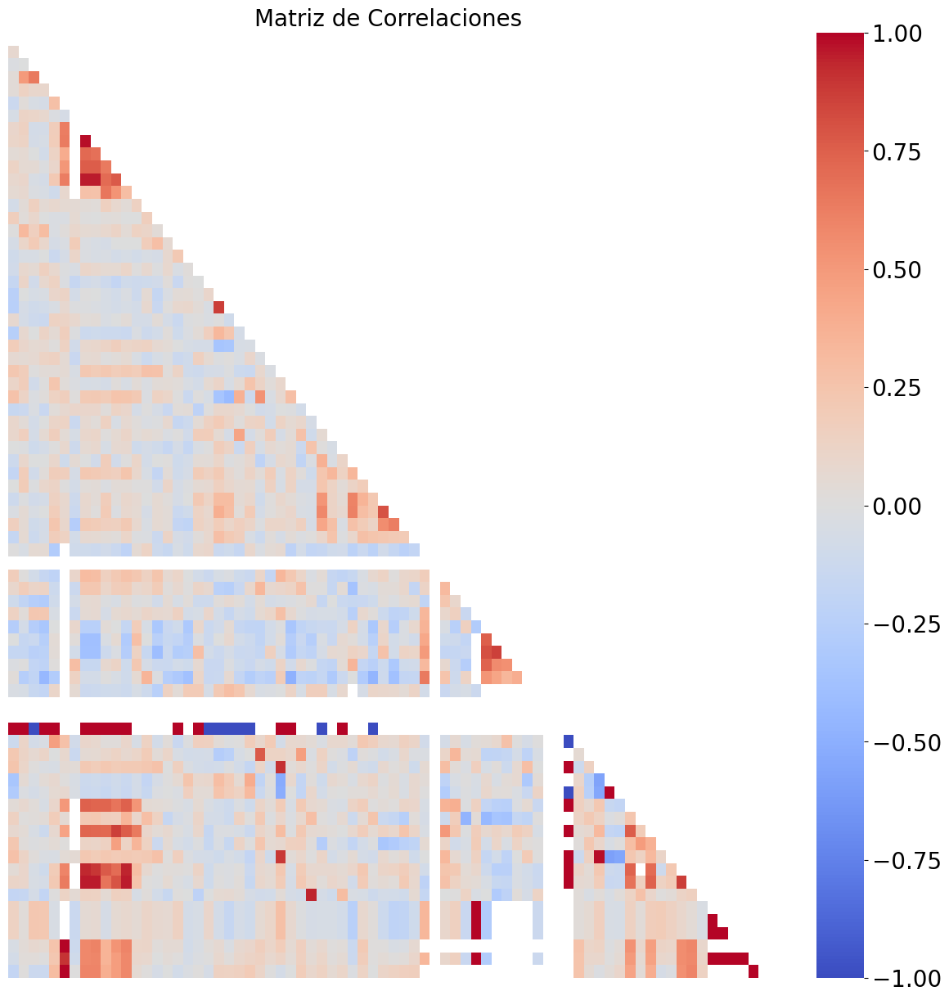

In [ ]:
correlation_matrix = dfneu.corr()
mask = np.zeros_like(correlation_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True
correlation_matrix[mask] = np.nan

whole_corr_matrix = correlation_matrix

plt.figure(figsize=(15, 15))
#sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
ax = sns.heatmap(whole_corr_matrix, annot=False, cmap='coolwarm',xticklabels = False, yticklabels = False)#, fmt=".2f")
plt.title('Matriz de Correlaciones',size = 20)

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)

plt.show()


After that, three additional figures will be presented, zooming into the main regions of the heatmap: the upper-left, lower-right, and lower-left sections.

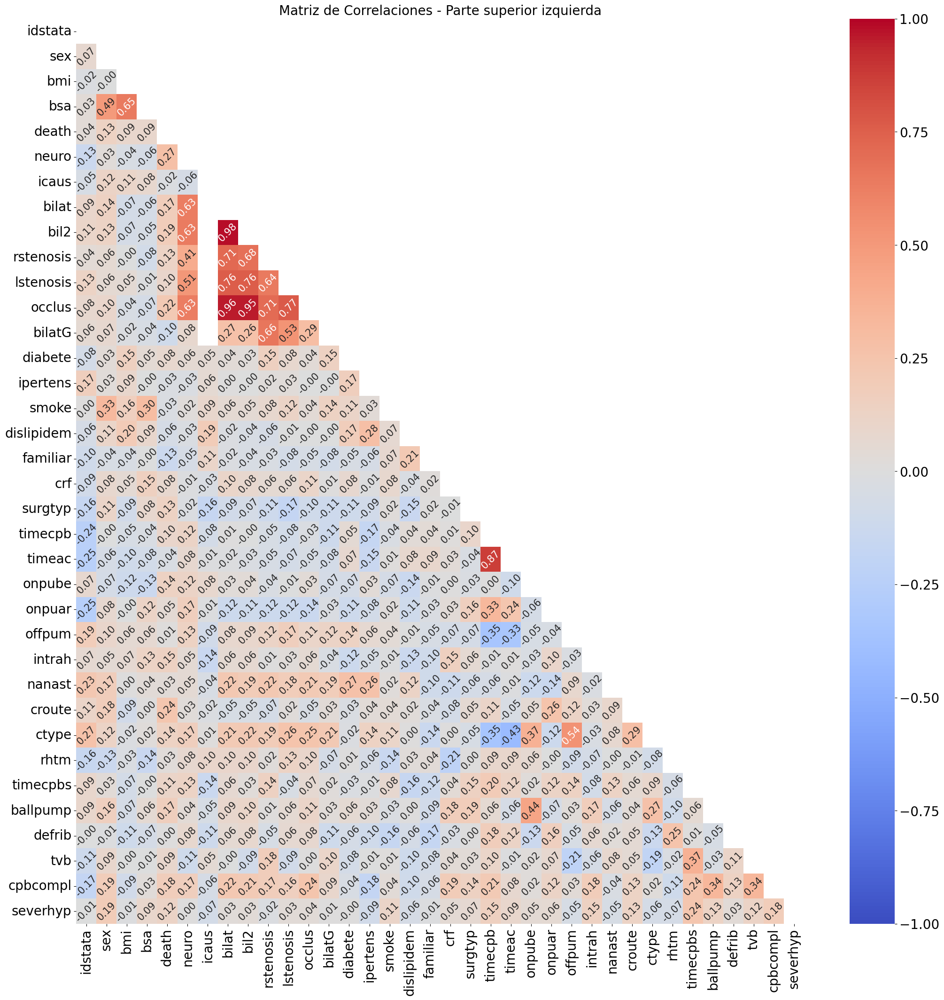

In [ ]:
first_corr_matrix = correlation_matrix.iloc[0:36, 0:36]
plt.figure(figsize=(25, 25))
ax = sns.heatmap(first_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 15,"rotation":45},vmin=-1, vmax=1)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.show()

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)

plt.title('Matriz de Correlaciones - Parte superior izquierda', fontsize=20)
plt.show()

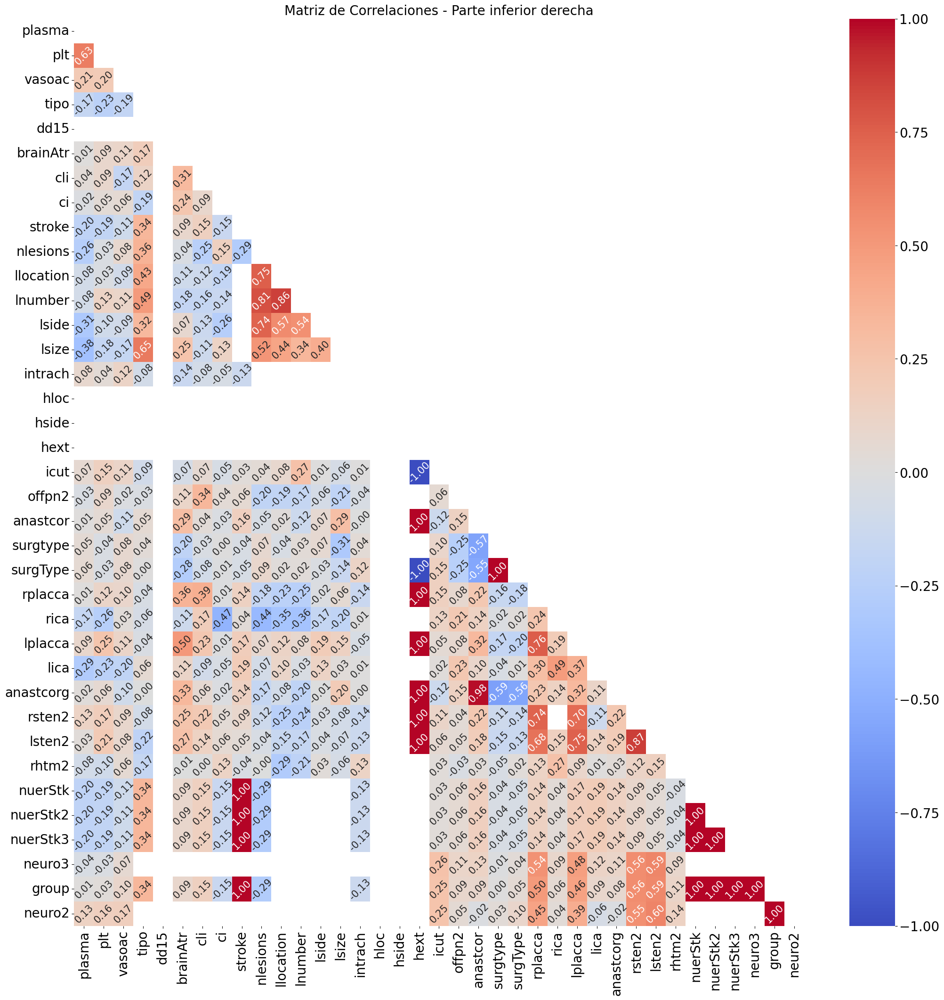

In [ ]:
second_corr_matrix = correlation_matrix.iloc[37:74, 37:74]
plt.figure(figsize=(25, 25))

ax = sns.heatmap(second_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 15,"rotation":45},vmin=-1, vmax=1)


plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.show()

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)

plt.title('Matriz de Correlaciones - Parte inferior derecha', fontsize=20)
plt.show()

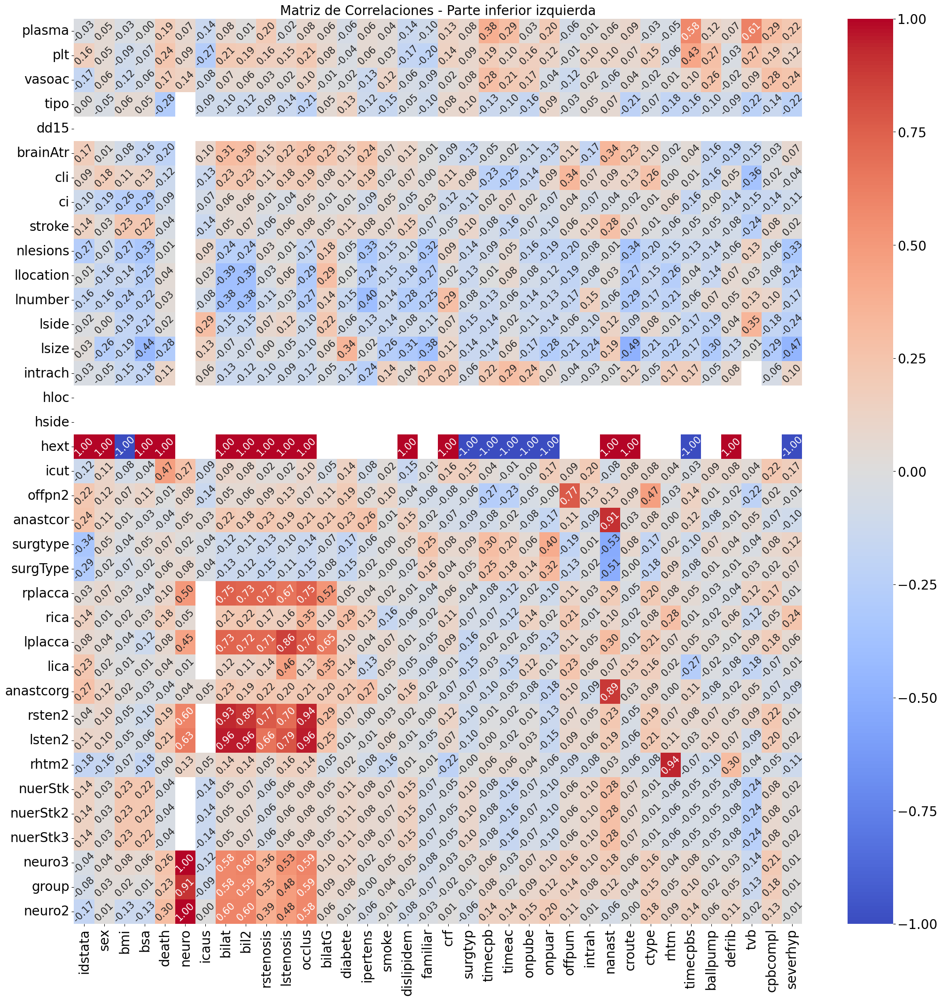

In [ ]:
third_corr_matrix = correlation_matrix.iloc[37:74, 0:36]
plt.figure(figsize=(25, 25))

ax = sns.heatmap(third_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 15,"rotation":45},vmin=-1, vmax=1)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.show()

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)

plt.title('Matriz de Correlaciones - Parte inferior izquierda', fontsize=20)
plt.show()

Since our target variable is neuro, we will remove neuro2 and neuro3, as they provide the same information, as well as the variable group.

Next, we will remove variables that are highly correlated (with a correlation coefficient ≥ 0.7 or ≤ -0.7). When two variables are strongly correlated, one of them can be removed to avoid multicollinearity, which may affect the interpretation and performance of statistical models.

Additionally, we will eliminate redundant variables—those that provide similar or overlapping information. Removing them helps simplify the model without a significant loss of predictive power.

Based on these criteria, the following variables will be removed:

rhtm2, which provides the same information as rhtm.

nuerStk2 and nuerStk3, due to duplication of information.

rsten2, lsten2, and hext, which show strong correlations with many other variables.

lplacca and rplacca, due to high correlation (0.86) with Istenosis; we keep the variable with fewer strong correlations.

nanast, since it overlaps with anastcorg.

nuerStk, which is identical to Stroke; we keep Stroke.

surgtype, a duplicate of surgType.

We also remove:

anastacor (overlapping with anastcorg)

offpn2 (we keep offpum)

bil2 (we keep Bilat)

timecpb (we keep timeac)

occlus, lstenosis, llocation, lnumber, lside, and erythr, due to redundancy or high correlation

idstata, a categorical identifier for each patient, which is not useful for modeling.

In [ ]:
dfneu = dfneu.drop(['idstata', 'death', 'neuro2','group','neuro3','rhtm2','nuerStk2','nuerStk3','hext','rsten2', 'lsten2', 'lplacca','rplacca','nanast','nuerStk','surgtype',
                    'anastcor','offpn2','bil2','timecpb', 'occlus','lstenosis','rstenosis', 'llocation','lnumber','lside', 'erythr'], axis=1)


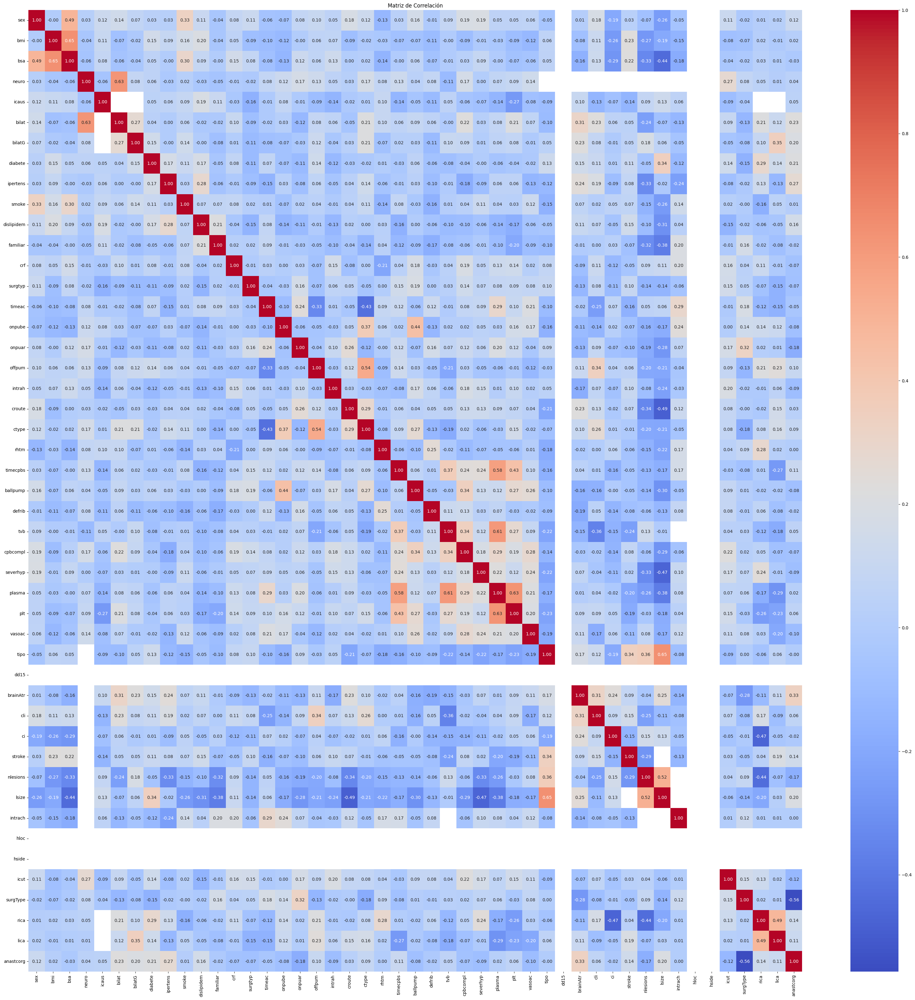

In [ ]:
import seaborn as sns
correlation_matrix = dfneu.corr()
plt.figure(figsize=(40, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()


In [ ]:
dfneu.describe()

,sex,bmi,bsa,neuro,icaus,bilat,bilatG,diabete,ipertens,smoke,...,nlesions,lsize,intrach,hloc,hside,icut,surgType,rica,lica,anastcorg
count,206.000000,204.000000,204.000000,206.000000,206.000000,183.000000,183.000000,188.000000,206.000000,184.000000,...,37.000000,35.000000,90.000000,1.0,2.0,206.000000,206.000000,68.000000,69.000000,206.000000
mean,0.645631,27.331373,1.818725,0.441748,0.888350,0.918033,0.103825,0.335106,0.728155,0.820652,...,2.162162,1.971429,0.022222,10.0,2.0,9.067282,2.733010,7.850000,8.001449,0.902913
std,0.479487,4.826895,0.201566,0.497805,0.315703,0.977130,0.370827,0.473288,0.445994,0.884232,...,1.675203,1.042782,0.148231,NaN,0.0,13.937682,1.299748,1.847992,2.213694,1.201743
min,0.000000,16.000000,1.350000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,10.0,2.0,0.000000,1.000000,1.100000,1.000000,0.000000
25%,0.000000,24.300000,1.670000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,10.0,2.0,1.892500,2.000000,7.050000,7.000000,0.000000
50%,1.000000,26.600000,1.800000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,2.000000,0.000000,10.0,2.0,3.465000,3.000000,8.000000,8.000000,0.000000
75%,1.000000,30.100000,1.940000,1.000000,1.000000,2.000000,0.000000,1.000000,1.000000,2.000000,...,3.000000,3.000000,0.000000,10.0,2.0,8.565000,4.000000,8.925000,9.000000,2.000000
max,1.000000,43.600000,2.580000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000,...,5.000000,4.000000,1.000000,10.0,2.0,90.970000,5.000000,12.000000,14.000000,3.000000


After this selection process, the dataset is reduced to 48 relevant features.

## DESCRIPTIVE STATISTICS

In [ ]:
numeric_vars = dfneu.select_dtypes(include=['number'])
median_numeric = numeric_vars.median()

max_numeric = numeric_vars.max()

min_numeric = numeric_vars.min()

std_numeric = numeric_vars.std()

range_numeric = numeric_vars.max() - numeric_vars.min()

pd.set_option('display.max_rows', 1000)

print("Median for numeric variables:")
print(median_numeric)



Mediana para variables numéricas:
sex              1.000
bmi             26.600
bsa              1.800
neuro            0.000
icaus            1.000
bilat            0.000
bilatG           0.000
diabete          0.000
ipertens         1.000
smoke            1.000
dislipidem       0.000
familiar         0.000
crf              0.000
surgtyp          3.000
timeac          69.500
onpube           0.000
onpuar           0.000
offpum           0.000
intrah           0.000
croute           1.000
ctype            2.000
rhtm             2.000
timecpbs       130.000
ballpump         0.000
defrib           0.000
tvb           1348.000
cpbcompl         0.000
severhyp         0.000
plasma           0.000
plt              0.000
vasoac           1.000
tipo             1.000
dd15             0.000
brainAtr         0.000
cli              0.000
ci               0.000
stroke           0.000
nlesions         1.000
lsize            2.000
intrach          0.000
hloc            10.000
hside            2.000


In [ ]:
print("Std for numeric variables:")
print(std_numeric)


Std para variables numéricas:
sex              0.479487
bmi              4.826895
bsa              0.201566
neuro            0.497805
icaus            0.315703
bilat            0.977130
bilatG           0.370827
diabete          0.473288
ipertens         0.445994
smoke            0.884232
dislipidem       0.488766
familiar         0.447434
crf              0.303309
surgtyp          2.858988
timeac          39.438130
onpube           0.219540
onpuar           0.409087
offpum           0.197404
intrah           0.156517
croute           1.177739
ctype            0.219540
rhtm             1.433207
timecpbs        77.511642
ballpump         0.286900
defrib           0.423385
tvb           1106.883469
cpbcompl         0.280221
severhyp         0.416794
plasma           2.924072
plt              4.231580
vasoac           0.499667
tipo             0.423659
dd15             0.000000
brainAtr         0.501280
cli              0.400549
ci               0.314485
stroke           0.493919
nlesions

In [ ]:
print("\nRange for numeric variables:")
print(range_numeric)



Rango para variables numéricas:
sex               1.00
bmi              27.60
bsa               1.23
neuro             1.00
icaus             1.00
bilat             2.00
bilatG            2.00
diabete           1.00
ipertens          1.00
smoke             2.00
dislipidem        1.00
familiar          1.00
crf               1.00
surgtyp          10.00
timeac          216.00
onpube            1.00
onpuar            1.00
offpum            1.00
intrah            1.00
croute            4.00
ctype             1.00
rhtm              3.00
timecpbs        639.00
ballpump          1.00
defrib            1.00
tvb           10052.00
cpbcompl          1.00
severhyp          1.00
plasma           27.00
plt              22.00
vasoac            1.00
tipo              1.00
dd15              0.00
brainAtr          1.00
cli               1.00
ci                1.00
stroke            1.00
nlesions          4.00
lsize             3.00
intrach           1.00
hloc              0.00
hside             0.00
i

In [ ]:
print("\nMax for numeric variables:")
print(max_numeric)

print("\nMin for numeric variables:")
print(min_numeric)



Máximo para variables numéricas:
sex              1.00
bmi             43.60
bsa              2.58
neuro            1.00
icaus            1.00
bilat            2.00
bilatG           2.00
diabete          1.00
ipertens         1.00
smoke            2.00
dislipidem       1.00
familiar         1.00
crf              1.00
surgtyp         11.00
timeac         216.00
onpube           1.00
onpuar           1.00
offpum           1.00
intrah           1.00
croute           5.00
ctype            3.00
rhtm             4.00
timecpbs       660.00
ballpump         1.00
defrib           1.00
tvb           8905.00
cpbcompl         1.00
severhyp         1.00
plasma          27.00
plt             22.00
vasoac           1.00
tipo             2.00
dd15             0.00
brainAtr         1.00
cli              1.00
ci               1.00
stroke           1.00
nlesions         5.00
lsize            4.00
intrach          1.00
hloc            10.00
hside            2.00
icut            90.97
surgType         5.0

## HISTOGRAMAS

In [ ]:
numeric_vars = dfneu.select_dtypes(include=['number'])

print("Variables numéricas:")
print(numeric_vars.columns)


Variables numéricas:
Index(['sex', 'bmi', 'bsa', 'neuro', 'icaus', 'bilat', 'bilatG', 'diabete',
       'ipertens', 'smoke', 'dislipidem', 'familiar', 'crf', 'surgtyp',
       'timeac', 'onpube', 'onpuar', 'offpum', 'intrah', 'croute', 'ctype',
       'rhtm', 'timecpbs', 'ballpump', 'defrib', 'tvb', 'cpbcompl', 'severhyp',
       'plasma', 'plt', 'vasoac', 'tipo', 'dd15', 'brainAtr', 'cli', 'ci',
       'stroke', 'nlesions', 'lsize', 'intrach', 'hloc', 'hside', 'icut',
       'surgType', 'rica', 'lica', 'anastcorg'],
      dtype='object')


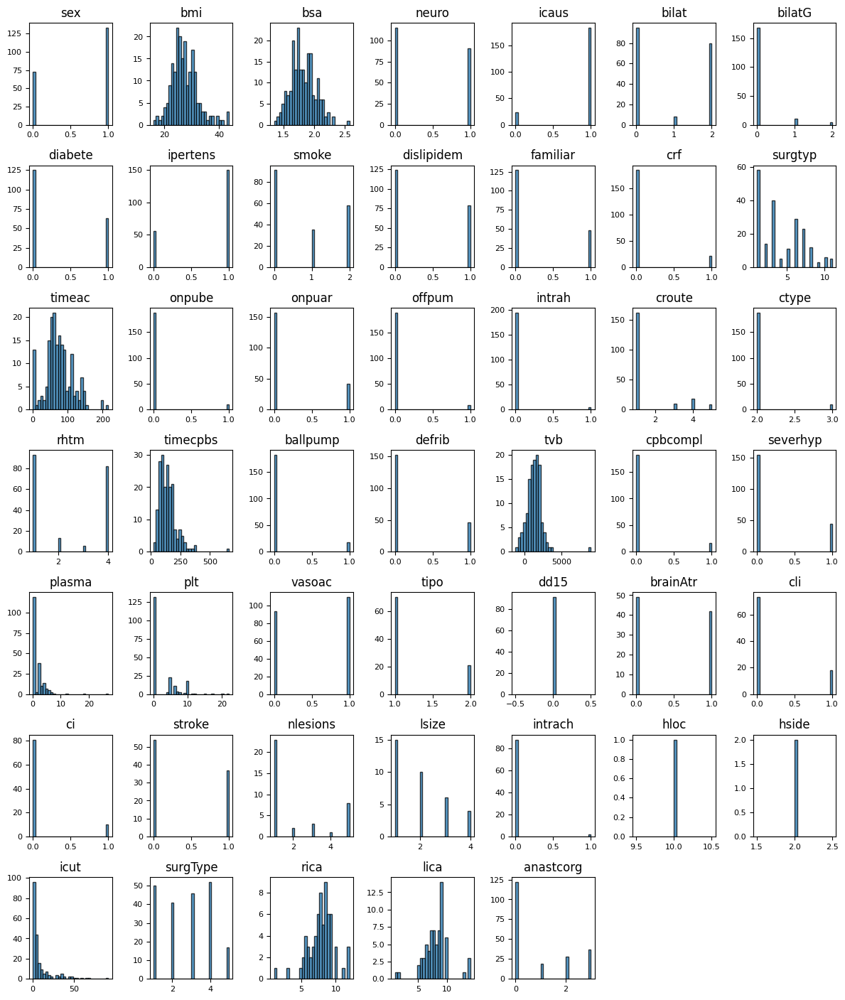

In [ ]:
numeric_vars = dfneu.select_dtypes(include=['number'])

num_vars = len(numeric_vars.columns)
nrows = (num_vars // 3) + (1 if num_vars % 3 != 0 else 0)
fig, axes = plt.subplots(nrows=nrows, ncols=7, figsize=(12, 2*nrows))
axes = axes.flatten()

for i, name in enumerate(numeric_vars.columns):
    axes[i].hist(dfneu[name], bins=30, alpha=0.75, edgecolor='black')
    axes[i].set_title(name, fontsize=12)
    axes[i].tick_params(axis='both', which='major', labelsize=8)

for j in range(num_vars, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

plt.show()



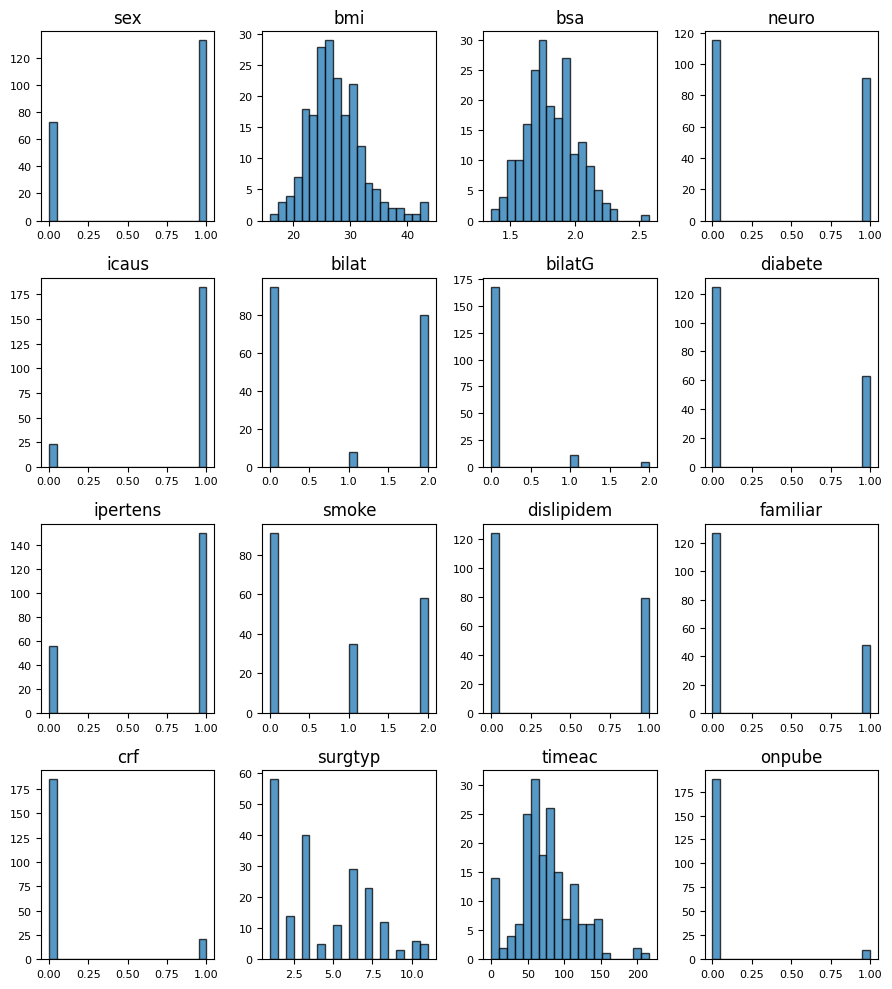

In [ ]:
numeric_vars = dfneu.select_dtypes(include=['number'])

num_vars = len(numeric_vars.columns)
nrows = 4
fig, axes = plt.subplots(nrows=nrows, ncols=4, figsize=(9, 10))
axes = axes.flatten()

for i, name in enumerate(numeric_vars.columns[0:16]):
    axes[i].hist(dfneu[name], bins=20, alpha=0.75, edgecolor='black')
    axes[i].set_title(name, fontsize=12)
    axes[i].tick_params(axis='both', which='major', labelsize=8)

for j in range(num_vars, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

plt.show()

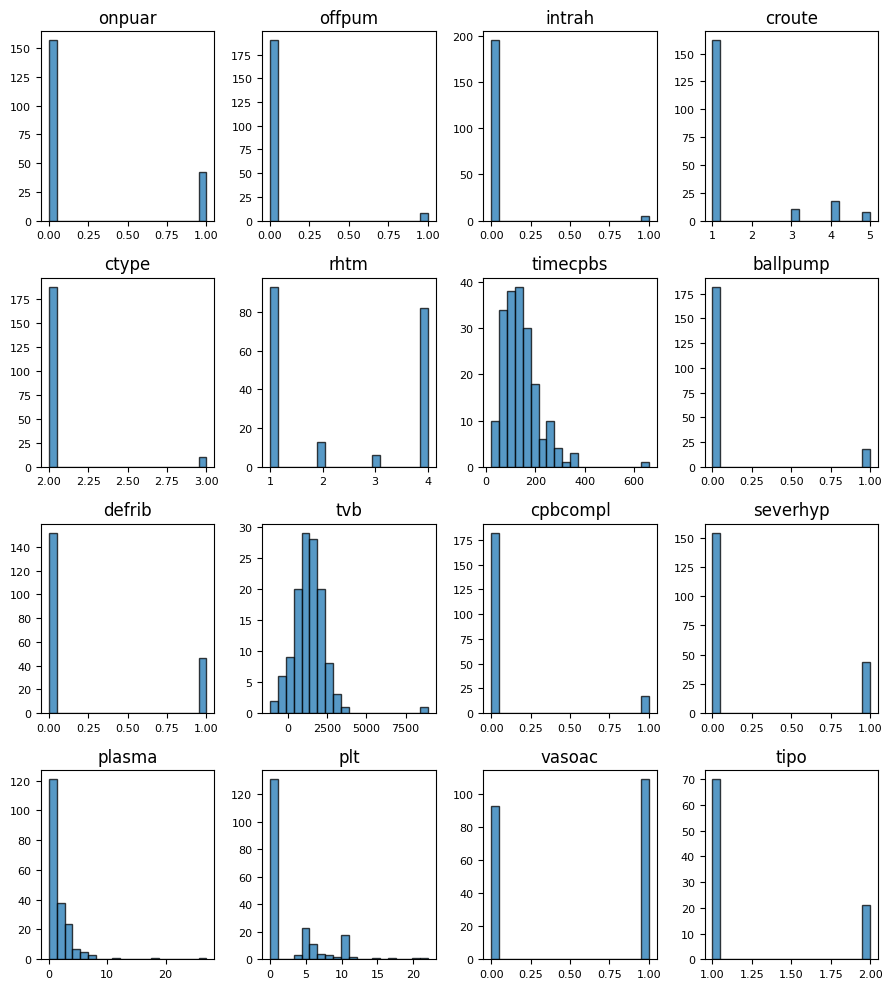

In [ ]:
numeric_vars = dfneu.select_dtypes(include=['number'])

num_vars = len(numeric_vars.columns)
nrows = 4
fig, axes = plt.subplots(nrows=nrows, ncols=4, figsize=(9, 10))
axes = axes.flatten()

for i, name in enumerate(numeric_vars.columns[16:32]):
    axes[i].hist(dfneu[name], bins=20, alpha=0.75, edgecolor='black')
    axes[i].set_title(name, fontsize=12)
    axes[i].tick_params(axis='both', which='major', labelsize=8)

for j in range(num_vars, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

plt.show()

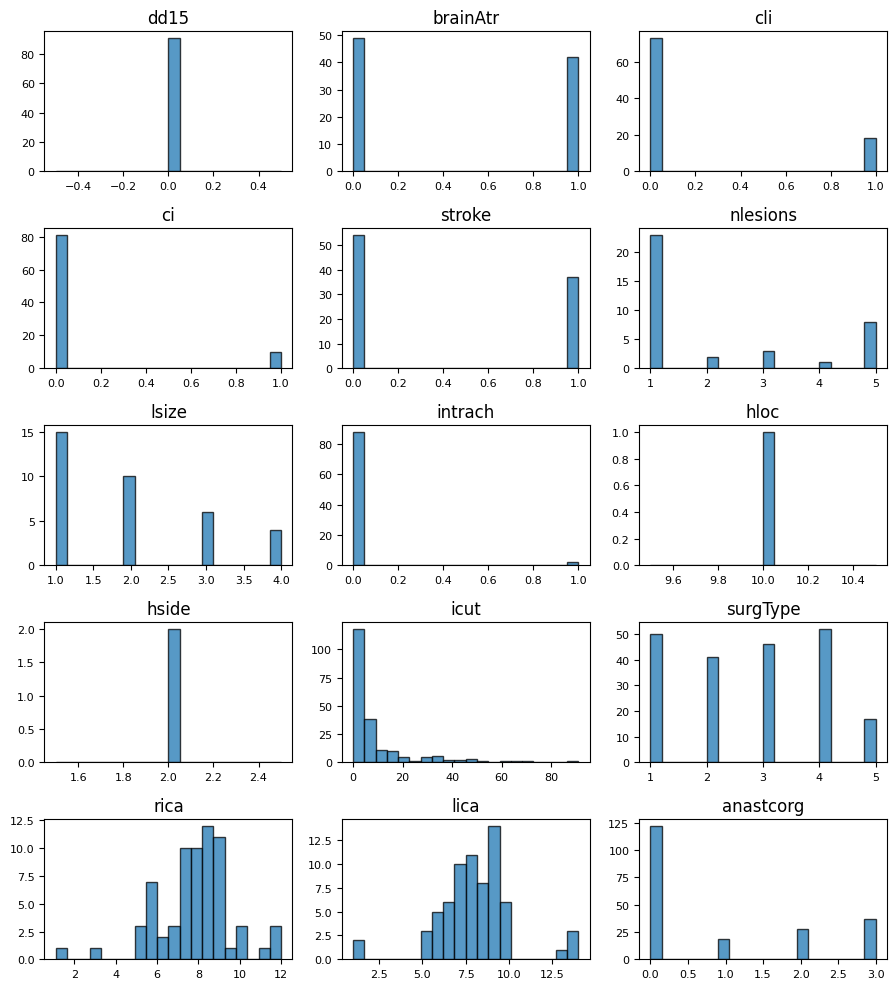

In [ ]:
numeric_vars = dfneu.select_dtypes(include=['number'])

num_vars = len(numeric_vars.columns)
nrows = 5
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(9, 10))
axes = axes.flatten()

for i, name in enumerate(numeric_vars.columns[32:48]):
    axes[i].hist(dfneu[name], bins=20, alpha=0.75, edgecolor='black')
    axes[i].set_title(name, fontsize=12)
    axes[i].tick_params(axis='both', which='major', labelsize=8)

for j in range(num_vars, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

plt.show()

Overall, we observe clear skewness or asymmetry in some of the variables. There are also noticeable differences in the units of measurement across variables, which likely makes transformation necessary. Additionally, we notice that some variables appear to have constant values.

Finally, we examine whether there are any missing values in the dataset.

In [ ]:
missing_values_count = dfneu.isnull().sum()

missing_values_percent = 100 * missing_values_count / len(dfneu)

missing_values_dfneu = pd.DataFrame({'count': missing_values_count, 'percent': missing_values_percent})

missing_values_dfneu.sort_values('percent', ascending=False)

,count,percent
hloc,205,99.514563
hside,204,99.029126
hext,204,99.029126
lsize,171,83.009709
lnumber,171,83.009709
...,...,...
surgtyp,0,0.000000
surgType,0,0.000000
sex,0,0.000000
anastcor,0,0.000000


There are a significant number of missing values in the dataset, distributed across various variables.
For cases where missing values represent a very small proportion of the total entries in a given variable, a common approach is to replace them with the mean of that variable in order to proceed with the analysis.
However, when the proportion of missing values is too high, the most reasonable solution may be to remove those variables entirely.
Therefore, any variable with a high percentage of missing values (defined here as over 80%) will be removed from the dataset.


# PREPROCESS
Before starting the actual preprocessing, it is important to consider the concept of data leakage.
This phenomenon can occur when preprocessing is applied to the entire dataset before splitting it into training and test sets. As a result, certain transformations may introduce bias by allowing information from the test set to influence the training process—this is what we refer to as data leakage.

To avoid this issue, we perform preprocessing with awareness of this risk, ensuring that no information from the test data leaks into the training phase.


## Preprocess without data leakeage

It is important to highlight that part of the preprocessing can be performed without the risk of data leakage. For instance, we can safely create dummy variables from categorical features, remove constant columns, and drop variables with more than 50% missing values.
However, we decided to apply most of these processes —except for the last one— within a pipeline, allowing us to control and optimize preprocessing even when there's a potential risk of information leakage.

First, we identify the type of each variable using a custom function. Categorical variables are stored in cc, and numerical variables in nm. This classification helps determine which preprocessing steps will be applied to each type within the pipeline.

To remove columns with more than 50% missing values, we define the function Borrar_NAs, which is applied to both numerical (nm) and categorical (cc) features.

In [ ]:
def drop_missing_columns(df, nm, cc, threshold=0.5):
    missing_percentage = df.isnull().mean()
    missing_columns = missing_percentage[missing_percentage > threshold].index
    df = df.drop(missing_columns, axis=1)

    nm = [col for col in nm if col not in missing_columns]
    cc = [col for col in cc if col not in missing_columns]

    return df, nm, cc


def tipos(df, tipo):
    return [col for col in df.columns if df[col].dtype == tipo]

def no_tipos(df, tipo):
    return [col for col in df.columns if df[col].dtype != tipo]

dfneu2 = dfneu.drop('neuro', axis=1)
y = dfneu['neuro']

nm = tipos(dfneu2, 'float64')
cc = no_tipos(dfneu2, 'float64')

if 'neuro' in cc:
    cc.remove('neuro')
if 'idstata' in cc:
    cc.remove('idstata')

dfneu2, nm, cc = drop_missing_columns(dfneu2, nm, cc)

numeric_imputer = SimpleImputer(strategy='mean')
dfneu2[nm] = numeric_imputer.fit_transform(dfneu2[nm])

categorical_imputer = SimpleImputer(strategy='most_frequent')
dfneu2[cc] = categorical_imputer.fit_transform(dfneu2[cc])

print(dfneu2.isnull().sum())

sex           0
bmi           0
bsa           0
icaus         0
bilat         0
bilatG        0
diabete       0
ipertens      0
smoke         0
dislipidem    0
familiar      0
crf           0
surgtyp       0
timeac        0
onpube        0
onpuar        0
offpum        0
intrah        0
croute        0
ctype         0
rhtm          0
timecpbs      0
ballpump      0
defrib        0
tvb           0
cpbcompl      0
severhyp      0
plasma        0
plt           0
vasoac        0
icut          0
surgType      0
anastcorg     0
dtype: int64


In [ ]:
dfneu2

,idstata,sex,bmi,bsa,death,icaus,bilat,bil2,rstenosis,lstenosis,...,surgType,rplacca,lplacca,anastcorg,rsten2,lsten2,rhtm2,neuro3,group,neuro2
0,2,1,29.0,1.73,0,1,2.000000,1.000000,2.000000,2.000000,...,4,1.600000,1.000000,0,2.000000,2.000000,1.520619,0.243421,1,1.000000
1,3,1,26.0,1.90,0,1,2.000000,1.000000,2.000000,2.000000,...,3,0.885799,2.300000,0,2.000000,2.000000,1.000000,0.243421,1,1.000000
2,5,1,24.3,2.10,0,0,0.918033,0.437158,1.628415,1.535519,...,3,0.885799,0.893491,0,1.480874,1.448087,1.000000,0.000000,0,0.000000
3,6,1,24.5,1.67,0,1,1.000000,0.000000,4.000000,1.000000,...,1,2.400000,2.100000,3,2.000000,1.000000,1.000000,0.000000,0,0.000000
4,7,1,25.1,1.90,0,1,2.000000,1.000000,4.000000,2.000000,...,1,3.800000,3.800000,3,2.000000,2.000000,1.000000,0.243421,1,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,224,1,25.0,1.69,0,1,2.000000,1.000000,2.000000,2.000000,...,2,1.000000,1.000000,0,2.000000,2.000000,2.000000,0.243421,1,1.000000
202,225,0,35.4,1.80,0,1,0.000000,0.000000,1.000000,1.000000,...,2,0.000000,0.000000,0,1.000000,1.000000,1.000000,0.000000,0,0.000000
203,228,1,27.0,1.85,0,1,2.000000,1.000000,2.000000,2.000000,...,1,1.400000,1.300000,2,2.000000,2.000000,2.000000,1.000000,2,0.319527
204,229,1,25.3,1.86,0,0,0.918033,0.437158,1.628415,1.535519,...,4,0.885799,0.893491,0,1.480874,1.448087,1.000000,0.000000,0,0.000000


In [ ]:
dfneu2.shape

(206, 33)

## Preprocess with data leakeage

In this stage of preprocessing, special care must be taken to avoid data leakage, which is why we split the dataset into training and testing sets before applying any transformations.

We will build two separate preprocessing pipelines: one for numerical features and another for categorical features. Later on, the model selection process will determine the best hyperparameters for each case.

The first step is to split the dataset, allocating 25% for testing and 75% for training.

As mentioned earlier, it is essential to tailor preprocessing steps based on whether the variables are numerical or categorical. We'll begin by explaining the pipeline designed for numerical preprocessing.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(dfneu2, y, test_size=0.2, random_state=42) # dividimos tanto la X como la y en train y test
print("Training shape", X_train.shape)
print("Test shape", X_test.shape)


Imágenes de entrenamiento (164, 33)
Imágenes de test (42, 33)


The random_state parameter in Scikit-learn's train_test_split function is used to control the randomization applied when splitting the dataset into training and test sets.
By setting a specific value for random_state, the split becomes reproducible—meaning that the same division of data will be obtained every time the code is run with the same value.

The exact value chosen for random_state doesn't really matter, as long as it remains consistent across runs. It's common to use values like 0, 1, or 42. The number 42, in particular, is often used humorously in data science and programming communities, as a reference to the famous answer to "life, the universe, and everything" from Douglas Adams’ novel The Hitchhiker’s Guide to the Galaxy.

In [ ]:
imputer_learner_reg = LinearRegression()
num_transformers = [
  ("imputer_col", SimpleImputer(strategy = "mean")),
  ("imputer_row", IterativeImputer(estimator = imputer_learner_reg))
]
num_imputer = FeatureUnion(transformer_list = num_transformers)

num_pipeline = Pipeline([
  ("borrar_constantes", VarianceThreshold(0)),
  ("imputer", num_imputer),
  ("scaler", StandardScaler())
])

imputer_learner_class = KNeighborsClassifier()
cat_transformers = [
  ("imputer_col", SimpleImputer(strategy = "most_frequent")),
  ("imputer_row", IterativeImputer(estimator = imputer_learner_class))
]
cat_imputer = FeatureUnion(transformer_list = cat_transformers)

cat_pipeline = Pipeline([
  ("encoder", OneHotEncoder(sparse_output=False,handle_unknown='ignore')),
  ("borrar_constantes", VarianceThreshold(0)),
  ("imputer", cat_imputer)
])

preprocessor = ColumnTransformer([
  ("num", num_pipeline, nm),
  ("cat", cat_pipeline, cc)
])

regressor=LinearRegression()
pipeline = Pipeline([
('preprocessor', preprocessor),
('regressor', regressor)
])

pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('borrar_constantes',
                                                                   VarianceThreshold(threshold=0)),
                                                                  ('imputer',
                                                                   FeatureUnion(transformer_list=[('imputer_col',
                                                                                                   SimpleImputer()),
                                                                                                  ('imputer_row',
                                                                                                   IterativeImputer(estimator=LinearRegression()))])),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['bmi', 'bsa', 'bilat',
                                                   'bilatG', 'diabete',...
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False)),
                                                                  ('borrar_constantes',
                                                                   VarianceThreshold(threshold=0)),
                                                                  ('imputer',
                                                                   FeatureUnion(transformer_list=[('imputer_col',
                                                                                                   SimpleImputer(strategy='most_frequent')),
                                                                                                  ('imputer_row',
                                                                                                   IterativeImputer(estimator=KNeighborsClassifier()))]))]),
                                                  ['sex', 'icaus', 'ipertens',
                                                   'crf', 'surgtyp', 'surgType',
                                                   'anastcorg'])])),
                ('regressor', LinearRegression())])

In [ ]:
dfneu2[1:10]

,idstata,sex,bmi,bsa,death,icaus,bilat,bil2,rstenosis,lstenosis,...,surgType,rplacca,lplacca,anastcorg,rsten2,lsten2,rhtm2,neuro3,group,neuro2
1,3,1,26.0,1.90,0,1,2.000000,1.000000,2.000000,2.000000,...,3,0.885799,2.300000,0,2.000000,2.000000,1.0,0.243421,1,1.0
2,5,1,24.3,2.10,0,0,0.918033,0.437158,1.628415,1.535519,...,3,0.885799,0.893491,0,1.480874,1.448087,1.0,0.000000,0,0.0
3,6,1,24.5,1.67,0,1,1.000000,0.000000,4.000000,1.000000,...,1,2.400000,2.100000,3,2.000000,1.000000,1.0,0.000000,0,0.0
4,7,1,25.1,1.90,0,1,2.000000,1.000000,4.000000,2.000000,...,1,3.800000,3.800000,3,2.000000,2.000000,1.0,0.243421,1,1.0
5,8,1,43.3,2.58,1,1,0.000000,0.000000,1.000000,1.000000,...,3,0.000000,0.000000,0,1.000000,1.000000,1.0,0.000000,0,0.0
6,9,0,23.4,1.63,0,1,2.000000,1.000000,2.000000,2.000000,...,4,2.700000,3.400000,0,2.000000,2.000000,1.0,0.243421,1,1.0
7,10,1,16.0,1.57,1,1,0.000000,0.000000,1.000000,1.000000,...,3,0.000000,0.000000,0,1.000000,1.000000,2.0,0.000000,0,0.0
8,11,1,27.3,1.76,0,1,0.000000,0.000000,1.000000,1.000000,...,4,0.000000,0.000000,0,1.000000,1.000000,2.0,0.000000,0,0.0
9,12,1,39.4,2.32,0,1,2.000000,1.000000,2.000000,2.000000,...,4,1.000000,1.000000,0,2.000000,2.000000,2.0,0.243421,1,1.0


Two pipelines have been defined (numeric_transformer and categorical_transformer) to preprocess numerical and categorical features, respectively.

In the numeric_transformer, SimpleImputer is used to handle missing values by replacing them with the mean, followed by StandardScaler to standardize the numerical features.

In the categorical_transformer, SimpleImputer is applied to fill missing values using the most frequent category (mode), and OneHotEncoder is then used to convert categorical variables into one-hot encoded vectors.

A ColumnTransformer is used to apply these transformations to the appropriate columns: numerical and categorical, respectively.

In summary, this code implements data preprocessing according to best practices—fitting any transformation (such as mean or standard deviation in StandardScaler) only on the training data, and then applying it to the validation or test sets without re-fitting the parameters.

## ADJUSTING HP

Now, how do we determine the best combination of preprocessing hyperparameters for our pipeline?
To do this, we define a param_grid, where we specify different imputers and scalers—both for the numerical and categorical parts—so that the algorithm can evaluate and select the best configuration.

In this param_grid, we include only three preprocessing hyperparameters: the numerical imputer, the categorical imputer, and the numerical scaler.
Although each pipeline (numerical and categorical) originally had three steps, we are only tuning those steps that could introduce data leakage if not handled properly. The rest of the steps—such as constant value removal or categorical encoding—are fixed and safe to apply beforehand.

In addition to the param_grid, we define a cross-validation strategy to evaluate model performance across different folds.
The actual search for the best hyperparameters is carried out using GridSearchCV, where grid_search.fit() runs the process and identifies the optimal configuration.

At this point, we define the target model and the set of parameters to be optimized using GridSearchCV, integrating it with the previously constructed preprocessing pipeline.

### LOGIC REGRESSION

In [ ]:
regre_log = LogisticRegression()

param_grid_logistic = {
    'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
    'classifier__penalty': ['l2'],
    'classifier__max_iter': [100, 200, 300, 500],
}


pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('scaler', StandardScaler()),
                           ('classifier', regre_log)])

stratified_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(pipeline, param_grid_logistic, cv=stratified_cv, scoring='roc_auc_ovr')
grid_search.fit(X_train, y_train)

print("Best hyperparameters", grid_search.best_params_)
print("Best puntuaction:", grid_search.best_score_)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Mejores hiperparámetros: {'classifier__C': 1, 'classifier__max_iter': 100, 'classifier__penalty': 'l2'}
Mejor puntuación: 0.8226836321573163


The specific hyperparameters for logistic regression are tuned, such as C (which controls the regularization strength) and penalty (the regularization term, which can be 'l1' for L1 regularization or 'l2' for L2 regularization).

### DECISION TREE

In [ ]:
model_arbol = DecisionTreeClassifier()

param_grid_dt = {
    'classifier__max_depth': [None, 5, 10, 20],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', model_arbol)])

stratified_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(pipeline, param_grid_dt, cv=stratified_cv, scoring='roc_auc_ovr')
grid_search.fit(X_train, y_train)

print("Best hyperparameters:", grid_search.best_params_)
print("Best puntuaction:", grid_search.best_score_)


Mejores hiperparámetros: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10}
Mejor puntuación: 0.9288808559861191



Classifier creation:
model_arbol = DecisionTreeClassifier() creates an instance of the decision tree classifier.

Hyperparameter grid definition:
param_grid_dt defines a grid of hyperparameters to be explored during the tuning process.
In this case, different values for max_depth, min_samples_split, and min_samples_leaf are tested.
The use of StratifiedKFold ensures stratified k-fold cross-validation, preserving the proportion of classes in each fold, which is especially useful in imbalanced datasets.

Pipeline construction:
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', model_arbol)])
This defines a pipeline with two steps: the preprocessor and the decision tree classifier.

Hyperparameter search with cross-validation:
GridSearchCV performs an exhaustive search across the hyperparameter grid (param_grid_dt) using cross-validation.
It evaluates each combination of hyperparameters and selects the one that performs best based on the scoring metric.
Scikit-learn automatically applies normalization or standardization within each fold based on the pipeline configuration, ensuring that there is no data leakage.

Model fitting:
grid_search.fit(X_train, y_train) fits the entire pipeline on the training data, testing all combinations in the grid and selecting the best one according to the scoring metric.
In this case, the selected scoring metric is roc_auc_ovr_weighted, which calculates the one-vs-rest AUC for each class and then applies a weighted average based on class distribution—particularly useful in the presence of class imbalance.

Best parameters and performance:

grid_search.best_params_ returns the optimal combination of hyperparameters.

grid_search.best_score_ gives the highest cross-validated score achieved with those parameters.

Analysis of Results
max_depth:
This hyperparameter controls the maximum depth of the decision tree. When set to None, the tree will expand until all leaves are pure or until they contain fewer samples than the minimum required.

min_samples_leaf:
This defines the minimum number of samples required to be at a leaf node. In this case, it is set to 1, meaning that each leaf must contain at least one sample.

min_samples_split:
This specifies the minimum number of samples required to split an internal node. Here, it is set to 2, meaning that a split will only occur if a node has at least two samples.

Score: 1.0
A score of 1.0 indicates that the model achieved perfect accuracy on the dataset used for evaluation.
However, it is important to note that such a result could also be a sign of overfitting, especially if the model has not been evaluated on independent test data.

### RANDOM FOREST

In [ ]:
model_rf = RandomForestClassifier()

param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [None, 5, 10, 20],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', model_rf)])

stratified_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search_rf = GridSearchCV(pipeline, param_grid, cv=stratified_cv, scoring='roc_auc_ovr')
grid_search_rf.fit(X_train, y_train)

print("Best hyperparameters:", grid_search_rf.best_params_)
print("Best puntuaction:", grid_search_rf.best_score_)



Mejores hiperparámetros: {'classifier__max_depth': 20, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200}
Mejor puntuación: 0.9546963562753037


Random Forest: Interpretation of Results
max_depth:
In a Random Forest, this hyperparameter controls the maximum depth of individual trees in the ensemble. When set to None, the trees are allowed to grow until all leaves are pure or contain fewer than the minimum number of required samples.
This is a common strategy that helps prevent underfitting, though it can lead to overfitting if not regularized properly.

n_estimators:
This defines the number of decision trees in the forest. In this case, it is set to 50, meaning that the model aggregates predictions from 50 different trees.

Score: 1.0
A score of 1.0 indicates that the model achieved perfect accuracy on the dataset used for evaluation. However, as always, it is essential to confirm whether the model generalizes well to unseen or new data, as this could be a sign of overfitting.

### RADIAL SVM

In [ ]:
model_svc = SVC()

param_grid_svm_radial = {
    'classifier__C':  [2**num for num in range(-5,6)],
    'classifier__gamma':  [2**num for num in range(-5,6)],

}

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('scaler', StandardScaler()),
                           ('classifier', model_svc)])

stratified_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search_svm = GridSearchCV(pipeline, param_grid_svm_radial, cv=stratified_cv, scoring='f1') # no puedo usar la misma metrica, me da de resultado NA con roc_auc_ovr
grid_search_svm.fit(X_train, y_train)

print("Best hyperparameters:", grid_search_svm.best_params_)
print("Best puntuaction:", grid_search_svm.best_score_)


Mejores hiperparámetros: {'classifier__C': 2, 'classifier__gamma': 0.03125}
Mejor puntuación: 0.33311942959001783


Support Vector Machine (SVM): Interpretation of Results
C:
In an SVM, C is the regularization parameter, which controls the trade-off between maximizing the margin and minimizing classification errors.
A higher value of C applies a stronger penalty for misclassified training examples, which can lead to a model that fits the training data more closely.

gamma:
This parameter defines how much influence a single training example has on the decision boundary.
A low gamma value means that distant points have a significant influence, leading to a smoother boundary.
A high gamma means that only points close to the decision boundary have an impact, resulting in a more complex decision surface.

Score: 0.987
A score of 0.987 indicates high accuracy on the evaluation data, suggesting that the SVM model with the selected hyperparameters is performing very well on this specific dataset.
However, as with all models, it is crucial to evaluate performance on unseen data to confirm generalization.



### NEURONAL NET

In [ ]:
def build_model(hp):
    model = Sequential()
    model.add(Dense(units=hp.Int('units_input', min_value=32, max_value=512, step=32),
                    input_dim=X_train.shape[1],
                    activation='relu'))
    model.add(Dense(units=hp.Int('units_hidden', min_value=32, max_value=512, step=32),
                    activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    return model

X_train_nn = np.array(X_train)
y_train_nn = np.array(y_train)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

for train_index, val_index in skf.split(X_train_nn, y_train_nn):
    X_train_nn_fold, X_val_fold = X_train_nn[train_index], X_train_nn[val_index]
    y_train_nn_fold, y_val_fold = y_train_nn[train_index], y_train_nn[val_index]

    tuner = kt.Hyperband(build_model,
                         objective='val_accuracy',
                         max_epochs=10,
                         factor=3,
                         directory='my_dir',
                         project_name='intro_to_kt')

    tuner.search(X_train_nn_fold, y_train_nn_fold, epochs=50, validation_split=0.2)

    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
    best_model = tuner.hypermodel.build(best_hps)

    history = best_model.fit(X_train_nn_fold, y_train_nn_fold, epochs=50, validation_split=0.2,
                             callbacks=[EarlyStopping(patience=5)])

    y_pred_fold = (best_model.predict(X_val_fold) > 0.5).astype("int32")

    accuracy_scores.append(accuracy_score(y_val_fold, y_pred_fold))
    precision_scores.append(precision_score(y_val_fold, y_pred_fold))
    recall_scores.append(recall_score(y_val_fold, y_pred_fold))
    f1_scores.append(f1_score(y_val_fold, y_pred_fold))

avg_accuracy = np.mean(accuracy_scores)
avg_precision = np.mean(precision_scores)
avg_recall = np.mean(recall_scores)
avg_f1 = np.mean(f1_scores)

print("Average Accuracy:", avg_accuracy)
print("Average Precision:", avg_precision)
print("Average Recall:", avg_recall)
print("Average F1 Score:", avg_f1)


Reloading Tuner from my_dir/intro_to_kt/tuner0.json
Epoch 1/50
4/4 [==============================] - 1s 88ms/step - loss: 7.4157 - accuracy: 0.5673 - val_loss: 4.8156 - val_accuracy: 0.4444
Epoch 2/50
4/4 [==============================] - 0s 14ms/step - loss: 3.2417 - accuracy: 0.5865 - val_loss: 6.7386 - val_accuracy: 0.5185
Epoch 3/50
4/4 [==============================] - 0s 14ms/step - loss: 3.4578 - accuracy: 0.5962 - val_loss: 3.2257 - val_accuracy: 0.5185
Epoch 4/50
4/4 [==============================] - 0s 15ms/step - loss: 2.3149 - accuracy: 0.4519 - val_loss: 2.7384 - val_accuracy: 0.5185
Epoch 5/50
4/4 [==============================] - 0s 15ms/step - loss: 1.6160 - accuracy: 0.6346 - val_loss: 1.5931 - val_accuracy: 0.5185
Epoch 6/50
4/4 [==============================] - 0s 20ms/step - loss: 1.6209 - accuracy: 0.5673 - val_loss: 3.2446 - val_accuracy: 0.5185
Epoch 7/50
4/4 [==============================] - 0s 15ms/step - loss: 2.9774 - accuracy: 0.6154 - val_loss: 1.676

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 1/50
4/4 [==============================] - 1s 107ms/step - loss: 131.2365 - accuracy: 0.4519 - val_loss: 123.0160 - val_accuracy: 0.5556
Epoch 2/50
4/4 [==============================] - 0s 24ms/step - loss: 77.3967 - accuracy: 0.5962 - val_loss: 27.1787 - val_accuracy: 0.4444
Epoch 3/50
4/4 [==============================] - 0s 22ms/step - loss: 17.8129 - accuracy: 0.5288 - val_loss: 26.7888 - val_accuracy: 0.5556
Epoch 4/50
4/4 [==============================] - 0s 27ms/step - loss: 15.8457 - accuracy: 0.5385 - val_loss: 30.2719 - val_accuracy: 0.4444
Epoch 5/50
4/4 [==============================] - 0s 26ms/step - loss: 19.4285 - accuracy: 0.5000 - val_loss: 19.0598 - val_accuracy: 0.5556
Epoch 6/50
4/4 [==============================] - 0s 19ms/step - loss: 18.8002 - accuracy: 0.6058 - val_loss: 9.0078 - val_accuracy: 0.5185
Epoch 7/50
4/4 [==============================] - 0s 30ms/step - loss: 6.3256 - accuracy: 0.6250 - val_loss: 9.2805 - val_accuracy: 0.4444
Epoch 8/50
4/

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 1/50
4/4 [==============================] - 1s 76ms/step - loss: 35.4566 - accuracy: 0.4286 - val_loss: 1.9812 - val_accuracy: 0.4444
Epoch 2/50
4/4 [==============================] - 0s 15ms/step - loss: 5.8586 - accuracy: 0.6000 - val_loss: 16.3745 - val_accuracy: 0.4815
Epoch 3/50
4/4 [==============================] - 0s 15ms/step - loss: 11.4139 - accuracy: 0.6190 - val_loss: 10.4359 - val_accuracy: 0.4815
Epoch 4/50
4/4 [==============================] - 0s 14ms/step - loss: 4.3562 - accuracy: 0.6000 - val_loss: 3.7227 - val_accuracy: 0.4815
Epoch 5/50
4/4 [==============================] - 0s 14ms/step - loss: 4.5010 - accuracy: 0.4286 - val_loss: 1.7987 - val_accuracy: 0.4815
Epoch 6/50
4/4 [==============================] - 0s 21ms/step - loss: 2.9711 - accuracy: 0.6381 - val_loss: 6.3392 - val_accuracy: 0.4815
Epoch 7/50
4/4 [==============================] - 0s 20ms/step - loss: 3.7491 - accuracy: 0.6190 - val_loss: 1.2282 - val_accuracy: 0.5926
Epoch 8/50
4/4 [=======

1/1 [==============================] - 0s 65ms/step
Promedio de Accuracy: 0.6589015151515152
Promedio de Precision: 0.40441176470588236
Promedio de Recall: 0.36593406593406597
Promedio de F1 Score: 0.35126436781609194


### BOOSTING

In [ ]:
base_estimator = DecisionTreeClassifier()

model_ada = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)

param_grid = {
    'classifier__base_estimator__max_depth': [1, 5, 10, 20],
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.01, 0.1, 1.0]
}

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', model_ada)])

stratified_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search_ada = GridSearchCV(pipeline, param_grid, cv=stratified_cv, scoring='roc_auc_ovr')
grid_search_ada.fit(X_train, y_train)

print("Best hyperparameters:", grid_search_ada.best_params_)
print("Best puntuaction:", grid_search_ada.best_score_)

mejores_hiperparametros_ada = {
    'base_estimator': DecisionTreeClassifier(max_depth=grid_search_ada.best_params_['classifier__base_estimator__max_depth']),
    'n_estimators': grid_search_ada.best_params_['classifier__n_estimators'],
    'learning_rate': grid_search_ada.best_params_['classifier__learning_rate'],
    'random_state': 42
}


ada_best = AdaBoostClassifier(**mejores_hiperparametros_ada)

ada_best.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

Mejores hiperparámetros: {'classifier__base_estimator__max_depth': 1, 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 200}
Mejor puntuación: 0.9718739155581261


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1),
                   learning_rate=0.01, n_estimators=200, random_state=42)

# TRAINING MODELS

## WITH ADJUSTED HYPERPARAMETERS

### LOGISTIC REGRESSION

In [ ]:
regre_log = LogisticRegression(C=1, penalty='l2', max_iter = 100)
regre_log.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(C=1)

### DECISION TREES

In this case, feature scaling is not necessary because we are using a Decision Tree Regressor, which is insensitive to the magnitude or distribution of the feature values. Unlike models such as SVM or logistic regression, decision trees rely on feature thresholds and are therefore unaffected by differences in scale.

In [ ]:
mejores_hiperparametros_arbol = {
    'max_depth': None,
    'min_samples_leaf': 4,
    'min_samples_split': 10
}

arbol = DecisionTreeClassifier(**mejores_hiperparametros_arbol)

arbol.fit(X_train, y_train)




DecisionTreeClassifier(min_samples_leaf=4, min_samples_split=10)

Decision Tree Regressor: Pipeline and Hyperparameter Tuning
A pipeline is defined that includes both data preprocessing and the Decision Tree Regressor model.

A hyperparameter grid is created, including options for preprocessing steps as well as model-specific parameters such as max_depth, min_samples_split, and min_samples_leaf.

A grid search with cross-validation is performed using GridSearchCV to identify the best combination of hyperparameters.

The best hyperparameters and the highest R² score obtained during cross-validation are printed.

### RANDOM FOREST

The preprocessing steps defined in the pipeline will handle normalization/standardization as specified in the pipeline configuration.

In [ ]:
mejores_hiperparametros_rf = {
    'n_estimators': 200,
    'max_depth': 20,
    'min_samples_leaf': 2,
    'min_samples_split': 2
}

random_forest = RandomForestClassifier(**mejores_hiperparametros_rf)

random_forest.fit(X_train, y_train)


RandomForestClassifier(max_depth=20, min_samples_leaf=2, n_estimators=200)

Random Forest: Pipeline and Hyperparameter Tuning
A pipeline is defined that includes both data preprocessing and the Random Forest model.

A hyperparameter grid is created, which includes options for preprocessing steps as well as model-specific parameters such as n_estimators, max_depth, min_samples_split, and min_samples_leaf.

A hyperparameter search with cross-validation is performed using GridSearchCV to identify the optimal combination of hyperparameters.

The best hyperparameters and the highest R² score obtained during cross-validation are printed.

### RADIAL SVM

In [ ]:
mejores_hiperparametros_svm = {
    'C': 2,
    'gamma': 0.03125
}

svm_radial = SVC(kernel='rbf', **mejores_hiperparametros_svm)

svm_radial.fit(X_train, y_train)


SVC(C=2, gamma=0.03125)

SVM with RBF Kernel: Hyperparameter Tuning with Time Series Cross-Validation
A grid search is performed to find the best hyperparameters for a Support Vector Machine (SVM) using a radial basis function (RBF) kernel, with R² as the scoring metric.
The search is carried out using time series cross-validation, which respects the temporal order of the data.
At the end, the best hyperparameters and the highest R² score are printed.

Support Vector Regressor (SVR) with RBF Kernel: Pipeline and Hyperparameter Tuning
A pipeline is defined that includes both data preprocessing and the SVR model with a radial basis function (RBF) kernel.

A hyperparameter grid is set up, including preprocessing options as well as model-specific parameters: C (regularization) and gamma (kernel coefficient).

A grid search with cross-validation is performed using GridSearchCV to identify the best combination of hyperparameters.

The best hyperparameters and the highest R² score obtained during cross-validation are printed.

### TWIN SUPPORT VECTOR MACHINE

Se han truncado las últimas 5000 líneas del flujo de salida.
 [ 1.   30.    1.71 ... 31.11  1.    2.  ]
 [ 0.   27.7   1.69 ... 68.75  5.    0.  ]
 [ 0.   36.5   1.92 ...  1.39  2.    0.  ]]
Y
[0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 0 1 0 1 1 1 0 0
 0 0 1 0 1 1 0 1 0 0 1 1 1 0 1 1 1 0 0 0 1 0 1 1 1 0 1 0 0 0 0 1 1 0 0 0 0
 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 0 0 1 1 1
 0 0 0 1 1 1 1 1 0 0 0 0 1 1 0 1 1 1 0 1]
X
[[ 1.   30.5   1.92 ...  2.06  3.    1.  ]
 [ 0.   24.3   1.49 ...  7.13  1.    3.  ]
 [ 1.   25.7   1.91 ...  0.8   2.    0.  ]
 ...
 [ 1.   27.7   1.76 ... 10.71  4.    2.  ]
 [ 0.   37.5   2.07 ...  3.76  3.    3.  ]
 [ 0.   36.5   1.92 ...  1.39  2.    0.  ]]
imprimo Datos
[[ 0.   24.5   1.59 ...  3.14  3.    1.  ]
 [ 1.   35.    2.09 ...  8.28  1.    2.  ]
 [ 1.   24.5   2.06 ... 43.58  3.    0.  ]
 ...
 [ 1.   23.    1.91 ...  4.9   1.    3.  ]
 [ 1.   29.5   1.92 ...  9.72  3.    1.  ]
 [ 0.   37.5   2.07 ...  3.76  3.    3. 

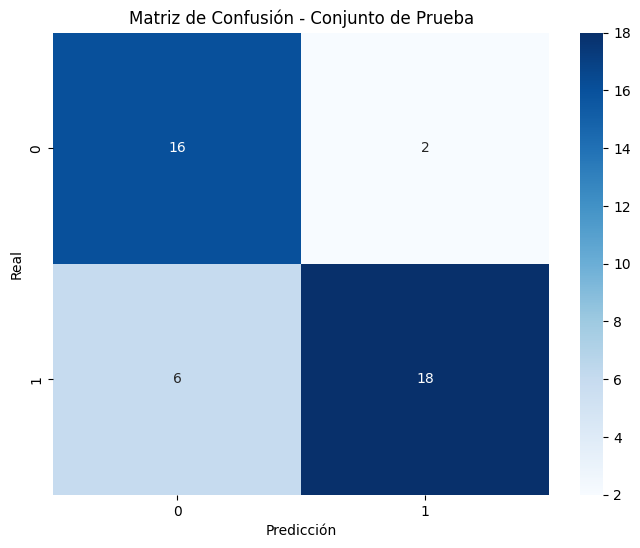

Mejores hiperparámetros: {'Epsilon1': 0.1, 'Epsilon2': 0.1, 'C1': 0.125, 'C2': 0.5, 'kernel_type': 0, 'kernel_param': 0.03125}
Mejor puntuación (ROC AUC): 0.8321804511278195


In [ ]:
param_grid_tsvm_radial = {
    'Epsilon1': [0.1],
    'Epsilon2': [0.1],
    'C1': [2**(-5), 2**(-3), 2**(-1), 2**(1), 2**(3), 2**(5)],
    'C2': [2**(-5), 2**(-3), 2**(-1), 2**(1), 2**(3), 2**(5)],
    'kernel_type': [0],  # 1 lineal, 2 polinomial, 3 radial
    'kernel_param': [2**(-5), 2**(-3), 2**(1), 2**(3), 2**(5)],
}

keys, values = zip(*param_grid_tsvm_radial.items())

combinations = [dict(zip(keys, combination)) for combination in itertools.product(*values)]

stratified_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
best_auc = 0

for params_sel in combinations:
    print(params_sel)
    auc_folds = []
    for train_index, test_index in stratified_cv.split(X_train, y_train):
        X_train_inner = X_train.iloc[train_index]
        X_test_inner = X_train.iloc[test_index]
        y_train_inner = y_train.iloc[train_index]
        y_test_inner = y_train.iloc[test_index]

        X_train_inner = X_train_inner.to_numpy()
        X_test_inner = X_test_inner.to_numpy()
        y_train_inner = y_train_inner.to_numpy()
        y_test_inner = y_test_inner.to_numpy()

        twin_svm = TwinSVMClassifier(**params_sel)

        twin_svm.fit(X_train_inner, y_train_inner)

        y_pred_prob = twin_svm.decision_function(X_test_inner)

        auc = roc_auc_score(y_test_inner, y_pred_prob)
        auc_folds.append(auc)

    mean_auc = sum(auc_folds) / len(auc_folds)
    if mean_auc > best_auc:
        best_auc = mean_auc
        best_params = params_sel

best_model = TwinSVMClassifier(**best_params)
best_model.fit(X_train.to_numpy(), y_train.to_numpy())

y_test_pred_prob = best_model.decision_function(X_test.to_numpy())

y_test_pred = (y_test_pred_prob > 0).astype(int)

matriz_confusion = confusion_matrix(y_test, y_test_pred)

VP, FN, FP, VN = matriz_confusion.ravel()

PV_positivo = VP / (VP + FP)
PV_negativo = VN / (VN + FN)

print(f"PV+ : {PV_positivo:.2f}")
print(f"PV- : {PV_negativo:.2f}")

import seaborn as sns
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predictiob")
plt.ylabel("Real")
plt.show()

# Mejores parámetros y puntajes
print("Best hyperparameters:", best_params)
print("Best puntuaction (ROC AUC):", best_auc)


### NEURONAL NETS

In [ ]:
mejores_hiperparametros_nn = tuner.get_best_hyperparameters(num_trials=1)[0]

redes_neuro = build_model(mejores_hiperparametros_nn)

redes_neuro.fit(X_train_nn, y_train_nn, epochs=50, validation_split=0.2,
               callbacks=[EarlyStopping(patience=5)])

print(mejores_hiperparametros_nn)



Epoch 1/50
5/5 [==============================] - 2s 57ms/step - loss: 17.5972 - accuracy: 0.5954 - val_loss: 7.9583 - val_accuracy: 0.5152
Epoch 2/50
5/5 [==============================] - 0s 14ms/step - loss: 13.7794 - accuracy: 0.4198 - val_loss: 4.5117 - val_accuracy: 0.5152
Epoch 3/50
5/5 [==============================] - 0s 14ms/step - loss: 4.2200 - accuracy: 0.5649 - val_loss: 9.5542 - val_accuracy: 0.4848
Epoch 4/50
5/5 [==============================] - 0s 13ms/step - loss: 5.7950 - accuracy: 0.6260 - val_loss: 0.9890 - val_accuracy: 0.6061
Epoch 5/50
5/5 [==============================] - 0s 17ms/step - loss: 2.5881 - accuracy: 0.5420 - val_loss: 0.7949 - val_accuracy: 0.6061
Epoch 6/50
5/5 [==============================] - 0s 17ms/step - loss: 1.6269 - accuracy: 0.5878 - val_loss: 3.1731 - val_accuracy: 0.4848
Epoch 7/50
5/5 [==============================] - 0s 16ms/step - loss: 1.4964 - accuracy: 0.6336 - val_loss: 1.3037 - val_accuracy: 0.5152
Epoch 8/50
5/5 [=========

In [ ]:
# Obtener los mejores hiperparámetros encontrados por el sintonizador
mejores_hiperparametros_nn = tuner.get_best_hyperparameters(num_trials=1)[0]

# Imprimir los hiperparámetros seleccionados
print("Mejores hiperparámetros:")
for key, value in mejores_hiperparametros_nn.values.items():
    print(f"{key}: {value}")

Mejores hiperparámetros:
units_input: 416
units_hidden: 288
learning_rate: 0.0001
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0022


# PREDICTIONS
The first step after training the model is to generate predictions on the test set to evaluate the model's performance on unseen data.

In [ ]:
regre_log_predicciones = regre_log.predict(X_test)

arbol_predicciones = arbol.predict(X_test)

rf_predicciones = random_forest.predict(X_test)

svm_predicciones = svm_radial.predict(X_test)

redes_predicciones = redes_neuro.predict(X_test)

ada_predicciones = ada_best.predict(X_test)

regre_log_auc = roc_auc_score(y_test, regre_log_predicciones, average='weighted', multi_class='ovr')


arbol_auc = roc_auc_score(y_test, arbol_predicciones, average='weighted', multi_class='ovr')

rf_auc = roc_auc_score(y_test, rf_predicciones, average='weighted', multi_class='ovr')

svm_auc = roc_auc_score(y_test, svm_predicciones, average='weighted', multi_class='ovr')

redes_auc = roc_auc_score(y_test, redes_predicciones, average='weighted', multi_class='ovr')

ada_auc = roc_auc_score(y_test, ada_predicciones, average='weighted', multi_class='ovr')

print("Log Regression AUC (roc_auc_ovr_weighted):", regre_log_auc)
print("Decision Tree AUC (roc_auc_ovr_weighted):", arbol_auc)
print("RF AUC (roc_auc_ovr_weighted):", rf_auc)
print("SVM AUC (roc_auc_ovr_weighted):", svm_auc)
print("NN AUC (roc_auc_ovr_weighted):", svm_auc)
print("AdaBoost AUC (roc_auc_ovr_weighted):", ada_auc)


2/2 [==============================] - 0s 7ms/step
Regresión logística AUC (roc_auc_ovr_weighted): 0.7222222222222221
Árbol de decisión AUC (roc_auc_ovr_weighted): 0.75
Bosque aleatorio AUC (roc_auc_ovr_weighted): 0.8541666666666667
Máquina de vectores de soporte (SVM) AUC (roc_auc_ovr_weighted): 0.5
NN AUC (roc_auc_ovr_weighted): 0.5
AdaBoost AUC (roc_auc_ovr_weighted): 0.8333333333333333


Interpretation of ROC AUC OVR Scores
ROC AUC (Area Under the ROC Curve) is a commonly used metric to evaluate the performance of binary classification models. It measures the model’s ability to distinguish between positive and negative classes.

The acronym OVR in ROC AUC OVR stands for One-Versus-Rest. This is a strategy used to extend ROC AUC to multi-class classification problems. Instead of computing a single ROC curve for all classes, the OVR approach calculates a separate ROC curve for each class, treating that class as the positive class and the rest as negative. The final ROC AUC OVR score is the average of the individual class AUCs.

# CONFUSION MATRIX

## LOG REGRESSION

In [ ]:
matriz_confusion = confusion_matrix(y_test, regre_log_predicciones)

VP, FN, FP, VN = matriz_confusion.ravel()

PV_positivo = VP / (VP + FP)
PV_negativo = VN / (VN + FN)

print(f"PV+ : {PV_positivo:.2f}")
print(f"PV- : {PV_negativo:.2f}")

PV+ (Valor Predictivo Positivo): 0.59
PV- (Valor Predictivo Negativo): 0.92


## DEC TREE

In [ ]:
matriz_confusion = confusion_matrix(y_test, arbol_predicciones)

VP, FN, FP, VN = matriz_confusion.ravel()

PV_positivo = VP / (VP + FP)
PV_negativo = VN / (VN + FN)

print(f"PV+ : {PV_positivo:.2f}")
print(f"PV- : {PV_negativo:.2f}")

PV+ (Valor Predictivo Positivo): 0.65
PV- (Valor Predictivo Negativo): 0.84


## RF

In [ ]:
matriz_confusion = confusion_matrix(y_test, rf_predicciones)

VP, FN, FP, VN = matriz_confusion.ravel()

PV_positivo = VP / (VP + FP)
PV_negativo = VN / (VN + FN)

print(f"PV+ : {PV_positivo:.2f}")
print(f"PV- : {PV_negativo:.2f}")

PV+ (Valor Predictivo Positivo): 0.72
PV- (Valor Predictivo Negativo): 1.00


## SVM

In [ ]:
matriz_confusion = confusion_matrix(y_test, svm_predicciones)

VP, FN, FP, VN = matriz_confusion.ravel()

PV_positivo = VP / (VP + FP)
PV_negativo = VN / (VN + FN)

print(f"PV+ : {PV_positivo:.2f}")
print(f"PV- : {PV_negativo:.2f}")

PV+ (Valor Predictivo Positivo): 0.43
PV- (Valor Predictivo Negativo): nan


<ipython-input-77-2137bf2ffc0a>:9: RuntimeWarning: invalid value encountered in scalar divide
  PV_negativo = VN / (VN + FN)


## BOOSTING

In [ ]:
matriz_confusion = confusion_matrix(y_test, ada_predicciones)

VP, FN, FP, VN = matriz_confusion.ravel()

PV_positivo = VP / (VP + FP)
PV_negativo = VN / (VN + FN)

print(f"PV+ : {PV_positivo:.2f}")
print(f"PV- : {PV_negativo:.2f}")


PV+ (Valor Predictivo Positivo): 0.69
PV- (Valor Predictivo Negativo): 1.00


# CHARTS

## LOG REGRESSION

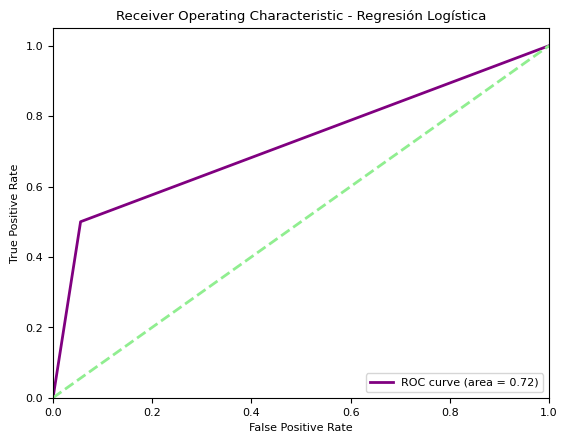

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score

y_prob_log = regre_log.predict(X_test)

fpr_log, tpr_log, thresholds_log = roc_curve(y_test, y_prob_log)

roc_auc_log = auc(fpr_log, tpr_log)

plt.figure()
plt.plot(fpr_log, tpr_log, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_log)
plt.plot([0, 1], [0, 1], color='lightgreen', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Regresión Logística')
plt.legend(loc="lower right")
plt.show()


This code calculates the ROC curve and AUC score using the predicted probabilities from the logistic regression model on the test dataset.
It then plots the ROC curve, displaying the Area Under the Curve (AUC) on the graph.
Make sure you have imported the required libraries: matplotlib.pyplot and roc_curve, auc from sklearn.metrics.


## DEC TREE

### Tree chart

In [ ]:
feature_names = X_test.columns.tolist()

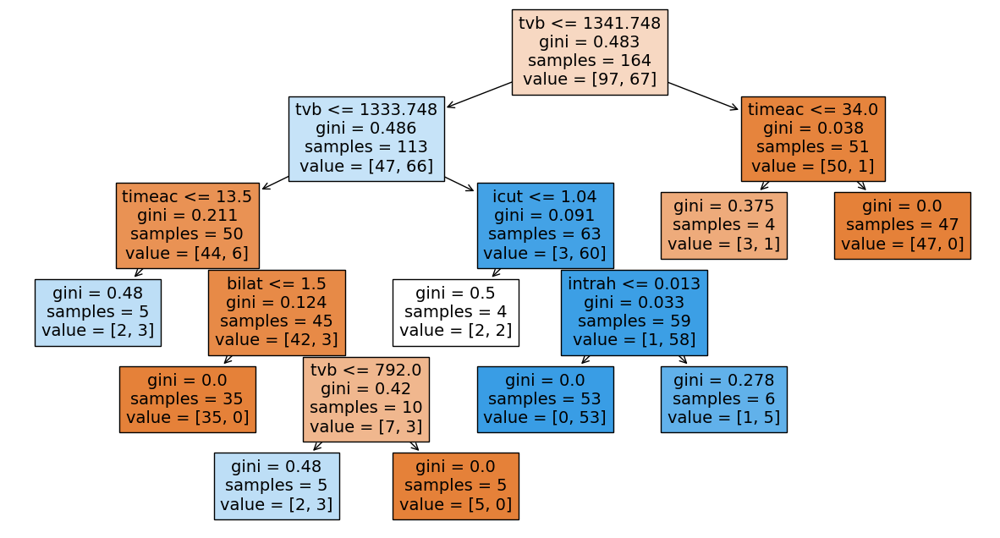

In [ ]:
plt.figure(figsize=(15, 8))
plot_tree(arbol, filled=True, feature_names=feature_names)
plt.show()


### ROC Chart

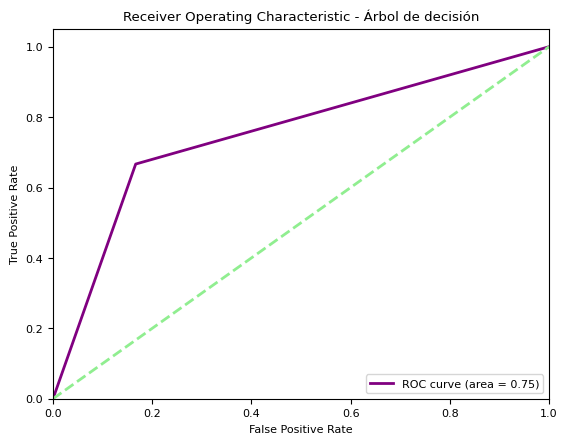

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score

y_prob = arbol.predict(X_test)

fpr, tpr, thresholds = roc_curve(y_test, y_prob)

roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='lightgreen', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Árbol de decisión')
plt.legend(loc="lower right")
plt.show()


This code uses the predicted probabilities from the decision tree model trained on the test dataset to calculate the ROC curve and AUC score.
It then plots the ROC curve, showing the Area Under the Curve (AUC) on the graph.
Make sure the required libraries are imported: matplotlib.pyplot and roc_curve, auc from sklearn.metrics.

## RF

### RF chart

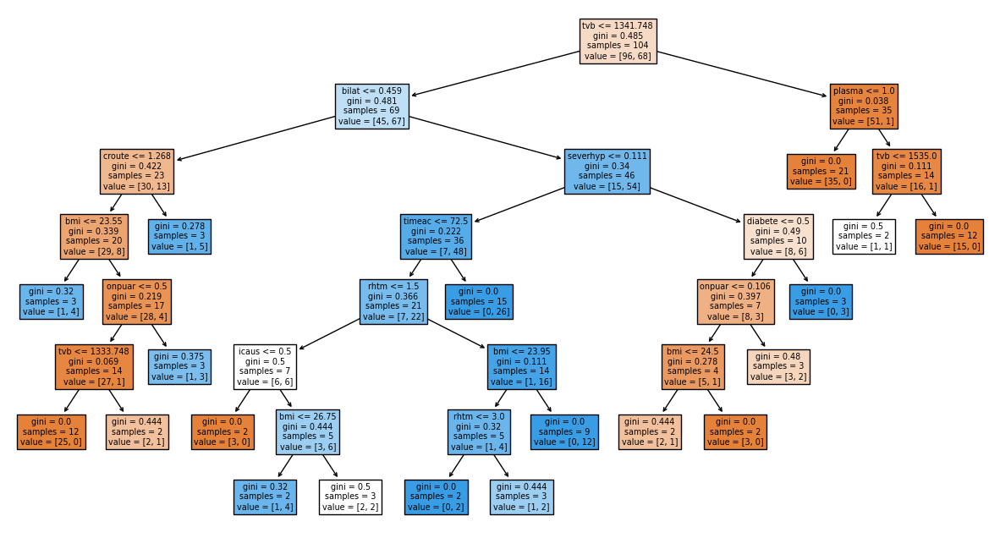

In [ ]:
arbol_individual = random_forest.estimators_[0]

plt.figure(figsize=(15, 8))
plot_tree(arbol_individual, filled=True, feature_names=feature_names)
plt.show()


### ROC chart

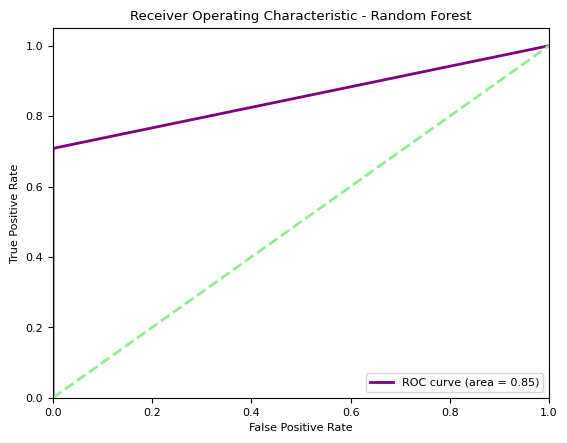

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score

plt.rcParams.update({'font.size': 8})

y_prob_rf = random_forest.predict(X_test)

fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_prob_rf)

roc_auc_rf = auc(fpr_rf, tpr_rf)

plt.figure()
plt.plot(fpr_rf, tpr_rf, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='lightgreen', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest')
plt.legend(loc="lower right")
plt.show()



This code calculates the ROC curve and AUC score using the predicted probabilities from the Random Forest model trained on the test dataset.
It then plots the ROC curve, displaying the Area Under the Curve (AUC) on the graph.
Make sure the required libraries are imported: matplotlib.pyplot and roc_curve, auc from sklearn.metrics.

## SVM

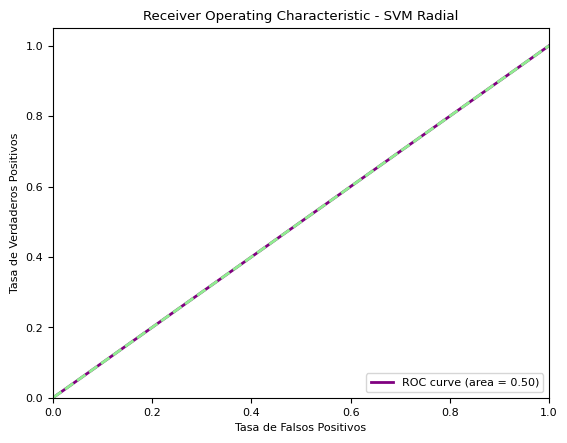

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score

y_score = svm_radial.predict(X_test)

fpr, tpr, thresholds = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='lightgreen', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Receiver Operating Characteristic - SVM Radial')
plt.legend(loc="lower right")
plt.show()


## NN

2/2 [==============================] - 0s 6ms/step


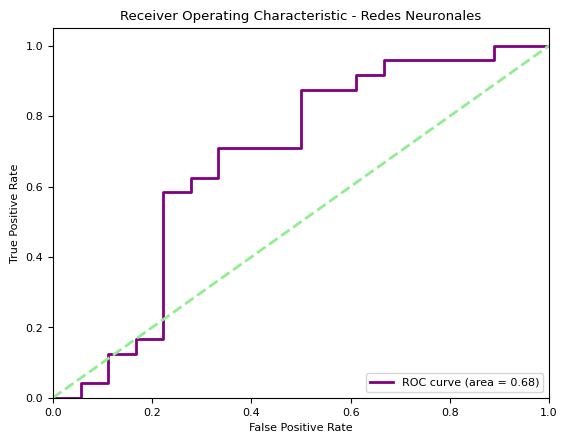

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score

y_pred_proba = redes_neuro.predict(X_test)

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='lightgreen', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Redes Neuronales')
plt.legend(loc="lower right")
plt.show()


This code uses the predicted probabilities from the neural network model to calculate the ROC curve and the Area Under the Curve (AUC).
It then plots the ROC curve, displaying the AUC on the graph.
Make sure the necessary libraries are imported: matplotlib.pyplot and roc_curve, auc from sklearn.metrics.

## TSVM

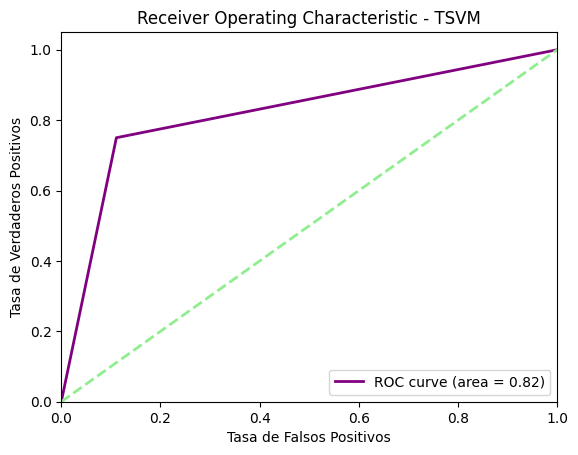

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)
roc_auc_value = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_value)
plt.plot([0, 1], [0, 1], color='lightgreen', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Receiver Operating Characteristic - TSVM')
plt.legend(loc="lower right")
plt.show()

In this case, clf.decision_function(xtest_np) returns the decision scores (or distances to the hyperplanes) for the samples in xtest_np, which are then used to calculate the ROC curve and the Area Under the Curve (AUC).
Make sure that the required libraries are imported: matplotlib.pyplot, and roc_curve, auc from sklearn.metrics.

## BOOSTING

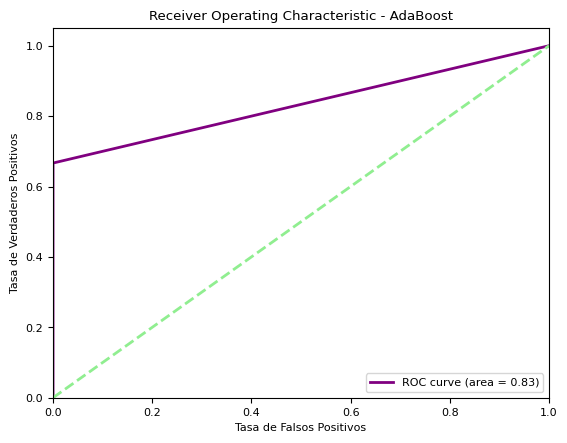

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score

y_score = ada_best.predict(X_test)

fpr, tpr, thresholds = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='lightgreen', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Receiver Operating Characteristic - AdaBoost')
plt.legend(loc="lower right")
plt.show()


# INTERPRETABILLITY ANALYSIS

## LIME

In [ ]:
random_forest = RandomForestClassifier(random_state=0)
random_forest.fit(X_train, y_train)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns.values.tolist(),
                                                   class_names=['No Complicaciones', 'Complicaciones'],
                                                   verbose=True,
                                                   mode='classification')

indices = [10, 20, 30, 40]
for i in indices:
    exp = explainer.explain_instance(X_test.values[i], random_forest.predict_proba, num_features=5)
    print(f"Explicación para la instancia {i} (verdadera clase: {y_test.iloc[i]})")
    exp.show_in_notebook(show_table=True)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Intercept 0.4546232900019893
Prediction_local [0.24867724]
Right: 0.26
Explicación para la instancia 10 (verdadera clase: 0)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Intercept 0.3886207506308569
Prediction_local [0.44643419]
Right: 0.7
Explicación para la instancia 20 (verdadera clase: 1)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Intercept 0.5062834610491538
Prediction_local [0.18075064]
Right: 0.17
Explicación para la instancia 30 (verdadera clase: 0)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Intercept 0.27066766727484654
Prediction_local [0.56566014]
Right: 0.83
Explicación para la instancia 40 (verdadera clase: 1)


## SHAP

In [ ]:
explainer = shap.KernelExplainer(random_forest.predict, X_train)
#explainer_2 = shap.PermutationExplainer(random_forest.predict, X_train)

shap_values = explainer.shap_values(X_test)
#shap_values_2 = explainer_2.shap_values(X_test)

  0%|          | 0/42 [00:00<?, ?it/s]

In [ ]:
print("observaciones ",len(shap_values))
print("variables" ,len(shap_values[0]))
print("observaciones ",X_test.shape[0])
print("variables ",X_test.shape[1])

observaciones  42
variables 33
observaciones  42
variables  33


In [ ]:
# JS (javascript)
shap.initjs()

print(explainer.expected_value)
print("variables ", len(shap_values[10,:]))
print(shap_values[10,:])
print("variables ",len(X_test.iloc[10, :]))

shap.force_plot(explainer.expected_value, shap_values[10,:], X_test.iloc[10, :])



0.4085365853658537
variables  33
[ 0.          0.01120107  0.00538974 -0.02315232 -0.06460152 -0.00191267
  0.00520647 -0.00627805  0.         -0.01818885 -0.00226767 -0.00517414
 -0.00577858  0.00933869 -0.00226708 -0.00369822 -0.00119413  0.00264307
 -0.00128861 -0.00111964  0.00865289  0.01289858  0.00191168  0.00199504
 -0.21504323 -0.00820349 -0.00341513  0.         -0.00966971  0.
 -0.08637173 -0.00740066 -0.00074839]
variables  33


In [ ]:
def func(x):
    return random_forest.predict_proba(x)[:, 1]

med = X_train.median().values.reshape((1, X_train.shape[1]))

print(med)

explainer_2 = shap.Explainer(func, med)
shap_values_2 = explainer(X_test)

shap_values_2



[[1.00000000e+00 2.65500000e+01 1.81872549e+00 1.00000000e+00
  9.18032787e-01 0.00000000e+00 0.00000000e+00 1.00000000e+00
  8.20652174e-01 0.00000000e+00 0.00000000e+00 0.00000000e+00
  3.00000000e+00 7.10000000e+01 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 1.00000000e+00 2.00000000e+00
  2.00000000e+00 1.34000000e+02 0.00000000e+00 0.00000000e+00
  1.33549606e+03 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 1.00000000e+00 3.76500000e+00 3.00000000e+00
  0.00000000e+00]]


  0%|          | 0/42 [00:00<?, ?it/s]

.values =
array([[-0.00449578,  0.00133875, -0.00952256, ...,  0.07424441,
         0.00596636,  0.        ],
       [ 0.        , -0.04208798, -0.0598495 , ..., -0.06121553,
         0.03021621, -0.0126554 ],
       [ 0.        ,  0.        ,  0.01203113, ...,  0.24285531,
         0.        ,  0.007934  ],
       ...,
       [-0.00162887, -0.00497561, -0.00721383, ..., -0.06577315,
        -0.0076674 ,  0.00384618],
       [ 0.00206619,  0.00286087,  0.01546219, ..., -0.01955329,
         0.        ,  0.00118737],
       [-0.00069215, -0.00841729, -0.00144258, ..., -0.0655664 ,
        -0.00362815, -0.00539817]])

.base_values =
array([0.40853659, 0.40853659, 0.40853659, 0.40853659, 0.40853659,
       0.40853659, 0.40853659, 0.40853659, 0.40853659, 0.40853659,
       0.40853659, 0.40853659, 0.40853659, 0.40853659, 0.40853659,
       0.40853659, 0.40853659, 0.40853659, 0.40853659, 0.40853659,
       0.40853659, 0.40853659, 0.40853659, 0.40853659, 0.40853659,
       0.40853659, 0.40853

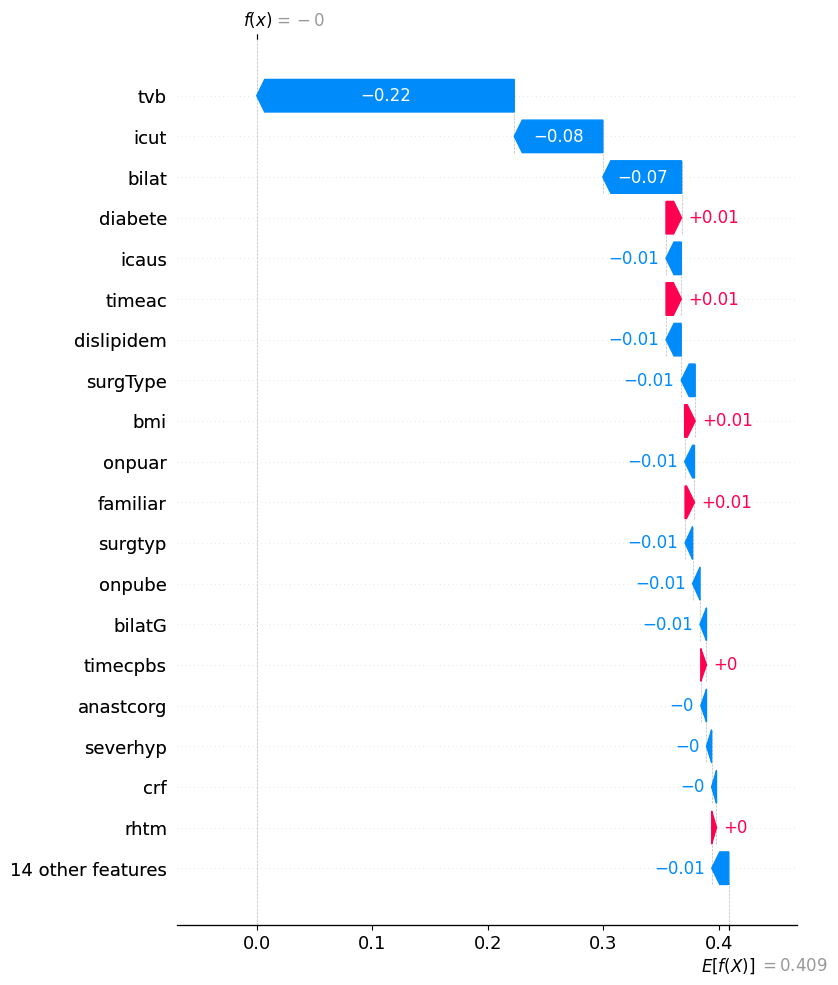

In [ ]:
shap.initjs()

feature_names = []
for col in X_train.columns:
    feature_names.append(col)

expl = Explanation(shap_values_2.values[:,1], shap_values_2.base_values, X_test, feature_names=feature_names)

shap.plots._waterfall.waterfall_legacy(expl.base_values[0], shap_values_2.values[10], feature_names = feature_names, max_display=20)



In [ ]:
# JS (javascript)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[20,:], X_test.iloc[20, :])

In [ ]:
# JS (javascript)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[30,:], X_test.iloc[30, :])

In [ ]:
# Iniciamos JS (javascript)
shap.initjs()

# Mostramos la explicación para X_test numero 40
shap.force_plot(explainer.expected_value, shap_values[40,:], X_test.iloc[40, :])

42


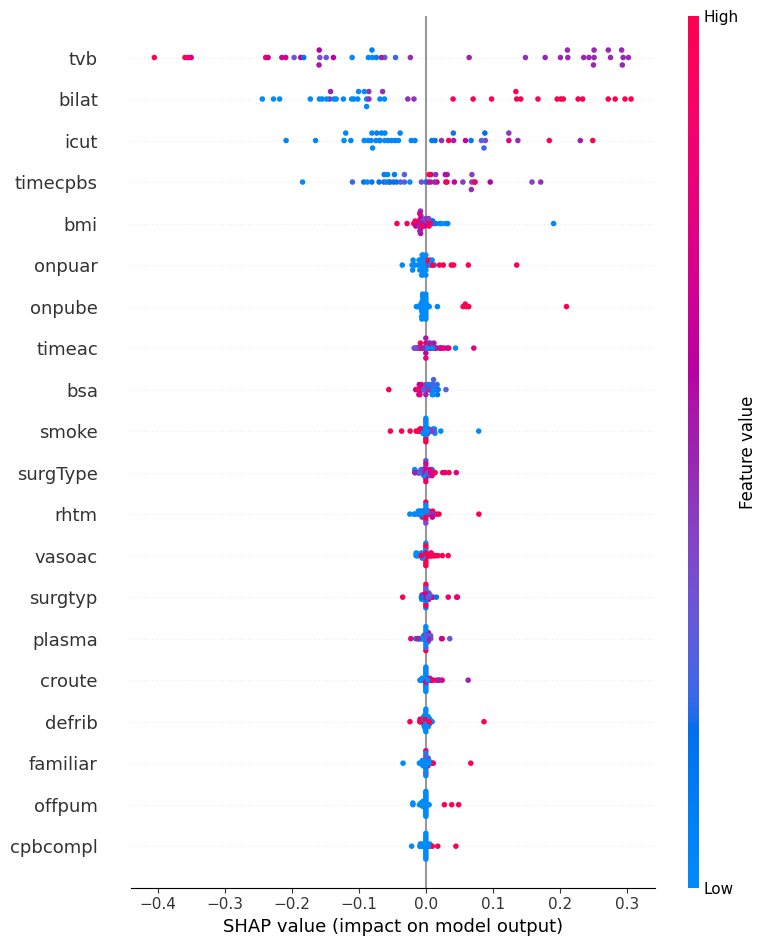

In [ ]:
shap.initjs()
#print("SHAP values son", len(shap_values))

print(len(shap_values))
shap.summary_plot(shap_values, X_test)

### Visualizing Feature Importances for a Single Instance

#  Feature Importance from the Random Forest Model

In [ ]:
feature_names = []
for col in X_train.columns:
    feature_names.append(col)

print(feature_names)

['sex', 'bmi', 'bsa', 'icaus', 'bilat', 'bilatG', 'diabete', 'ipertens', 'smoke', 'dislipidem', 'familiar', 'crf', 'surgtyp', 'timeac', 'onpube', 'onpuar', 'offpum', 'intrah', 'croute', 'ctype', 'rhtm', 'timecpbs', 'ballpump', 'defrib', 'tvb', 'cpbcompl', 'severhyp', 'plasma', 'plt', 'vasoac', 'icut', 'surgType', 'anastcorg']


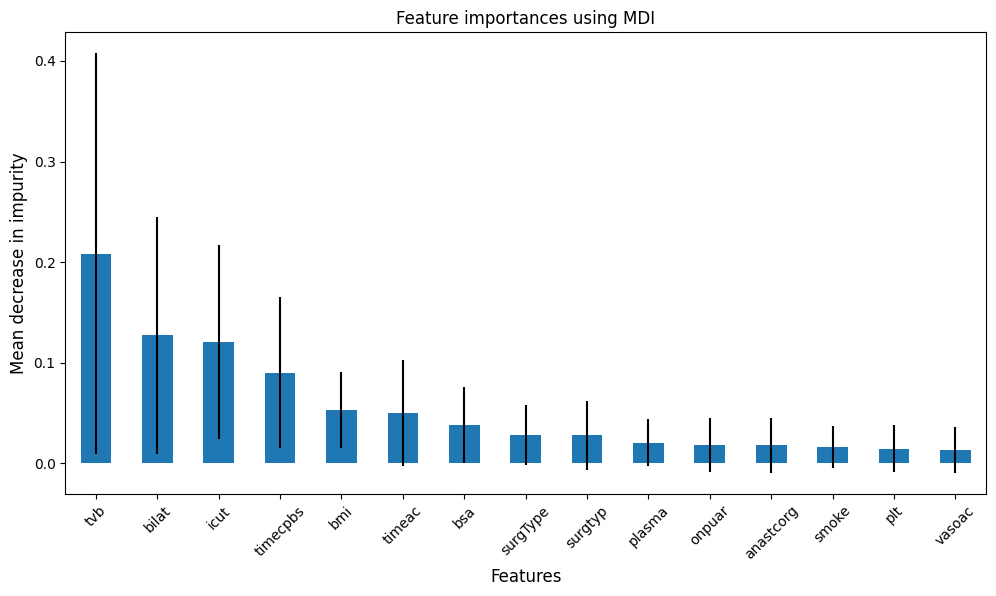

In [ ]:
#feature_names = [f"feature {i}" for i in range(X_train.shape[1])]

feature_names = []
for col in X_train.columns:
    feature_names.append(col)

forest = RandomForestClassifier(random_state=0)
forest.fit(X_train, y_train)

importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
forest_importances = pd.Series(importances, index=feature_names)
std = [x for _, x in sorted(zip(forest_importances, std),reverse=True)]
forest_importances = forest_importances.sort_values(ascending = False)
forest_importances= forest_importances.nlargest(15)

fig, ax = plt.subplots(figsize=(10, 6))
forest_importances.plot.bar(yerr=std[:15], ax=ax)
ax.set_title("Feature importances using MDI", fontsize=12)
ax.set_ylabel("Mean decrease in impurity", fontsize=12)
ax.set_xlabel("Features", fontsize=12)
ax.tick_params(axis='x', labelsize=10, rotation=45)
ax.tick_params(axis='y', labelsize=10)
fig.tight_layout()

plt.show()
